In [51]:
#loading libraries 
import pandas as pd
import numpy as np
import time
import tweepy
import re
import json
import glob
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from textblob import TextBlob
from PIL import Image
import plotly.express as px # To make express plots in Plotly
import spacy
nlp = spacy.load('en_core_web_sm')
import nltk
nltk.download('stopwords')
from nltk.tokenize import TweetTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

from collections import Counter

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/evgeniya/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [10]:
pip install wordcloud

     |████████████████████████████████| 363 kB 4.6 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [9]:
!pip install vaderSentiment

In [71]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

In [6]:
pip install -U textblob

     |████████████████████████████████| 636 kB 3.9 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [7]:
from textblob import TextBlob

In [52]:
clean_tweets = pd.read_csv('../tweeter/df_tweets.csv')

In [53]:
clean_tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89315 entries, 0 to 89314
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  89315 non-null  int64 
 1   text        89314 non-null  object
dtypes: int64(1), object(1)
memory usage: 1.4+ MB


In [ ]:
##Subjectivity(emotions/judgement) oor Polarity(neg1 pos1)

In [54]:
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity


In [55]:
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

In [56]:
clean_tweets['text'].dtype

dtype('O')

In [57]:
clean_tweets['text'] = clean_tweets['text'].astype(str)

In [58]:
clean_tweets['Subjectivity'] = clean_tweets['text'].apply(getSubjectivity)
clean_tweets['Polarity'] = clean_tweets['text'].apply(getPolarity)

In [59]:
clean_tweets.head()

,Unnamed: 0,text,Subjectivity,Polarity
0,0,generally masking requirement cross border tra...,0.188889,0.016667
1,1,u wear mask u naver happy mask,1.000000,0.800000
2,2,masking almost wiped flu past couple year isnt...,0.402381,0.062857
3,3,ffsmy county highest rate regionive never stop...,0.000000,0.000000
4,4,doublevaxxed covid taking another vaccine stil...,0.000000,0.000000


In [46]:
# Plotting the word cloud for Positive Tweets

In [60]:
pos_tweets = clean_tweets[clean_tweets['Polarity'] > 0].sort_values(['Polarity'], ascending = False)

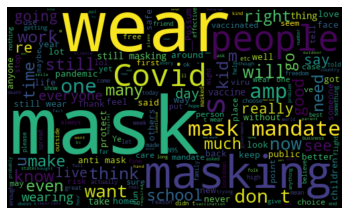

In [113]:
allWords = ''.join([twts for twts in pos_tweets['text']])

wordCloud = WordCloud(width = 500, height=300, random_state = 21, max_font_size = 119).generate(allWords)

plt.imshow(wordCloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [61]:
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive' 


In [62]:
clean_tweets['Analysis'] = clean_tweets['Polarity'].apply(getAnalysis)

In [206]:
#plt.figure(figsize=(8,6))
#for i in range(0, clean_tweets.shape[0]):
#    plt.scatter(clean_tweets['Polarity'][i], clean_tweets['Subjectivity'][i], color ='Blue')
#plt.title('Sentiment Analysis')
#plt.xlabel('Polarity')
#plt.ylabel('Subjectivity')
#plt.show()

In [63]:
clean_tweets['Analysis'].value_counts()

Positive    36549
Neutral     27327
Negative    25439
Name: Analysis, dtype: int64

In [64]:
sentiment_chart = clean_tweets['Analysis'].value_counts().rename_axis('Sentiment').to_frame('Number of Tweets').reset_index()

In [65]:
fig2=px.bar(sentiment_chart, x = 'Sentiment', y = 'Number of Tweets', color = 'Sentiment')
fig2
fig2.update_layout(title=dict(text="Sentiment Analysis</i>",
                  font=dict(size=18, )))
fig2.update_layout(
    xaxis_title="Sentiment",
    yaxis_title="Number of Tweets",
    legend_title="Sentiment",
    font=dict(
        #family="Courier New, monospace",
        size=14
    ))

In [66]:
clean_tweets[['text','Analysis']]

,text,Analysis
0,generally masking requirement cross border tra...,Positive
1,u wear mask u naver happy mask,Positive
2,masking almost wiped flu past couple year isnt...,Positive
3,ffsmy county highest rate regionive never stop...,Neutral
4,doublevaxxed covid taking another vaccine stil...,Neutral
...,...,...
89310,two half year dodging covid drop masking requi...,Positive
89311,easiest answer cancel truth seems isnt possibl...,Positive
89312,smart safe rule thumb use possibility error ju...,Positive
89313,leech hhs science prof universal esp high filt...,Positive


In [24]:
sentiment_list = []
for tweet in clean_tweets.loc[clean_tweets['Analysis'] == 'Positive', 'text']:
    token = nltk.tokenize.word_tokenize(tweet)
    sentiment_list.append(token)
positive_words = [i for j in sentiment_list for i in j]

In [29]:
positive_words_counts = Counter(positive_words)
positive_df = pd.DataFrame.from_dict(positive_words_counts, orient='index').reset_index()
positive_df.columns = ['Words', 'Count']
positive_df.sort_values(by='Count', ascending=False, inplace=True)

In [32]:
positive_df.head(10)

,Words,Count
27,mask,28185
26,wear,18546
1,masking,15025
49,people,7245
53,covid,6883
13,dont,5912
84,mandate,5273
63,still,5008
274,im,4670
54,one,4391


In [34]:
sentiment_list2 = []
for tweet in clean_tweets.loc[clean_tweets['Analysis'] == 'Negative', 'text']:
    token = nltk.tokenize.word_tokenize(tweet)
    sentiment_list2.append(token)
negative_words = [i for j in sentiment_list2 for i in j]

In [35]:
negative_words_counts = Counter(negative_words)
negative_df = pd.DataFrame.from_dict(negative_words_counts, orient='index').reset_index()
negative_df.columns = ['Words', 'Count']
negative_df.sort_values(by='Count', ascending=False, inplace=True)

In [37]:
negative_df.head(10)

,Words,Count
3,mask,20172
2,wear,13889
57,masking,9700
11,people,5611
294,covid,4911
27,dont,4278
72,im,3529
4,still,3490
42,mandate,3297
49,one,3141


In [38]:
sentiment_list3 = []
for tweet in clean_tweets.loc[clean_tweets['Analysis'] == 'Neutral', 'text']:
    token = nltk.tokenize.word_tokenize(tweet)
    sentiment_list3.append(token)
neutral_words = [i for j in sentiment_list3 for i in j]

In [39]:
neutral_words_counts = Counter(neutral_words)
neutral_df = pd.DataFrame.from_dict(neutral_words_counts, orient='index').reset_index()
neutral_df.columns = ['Words', 'Count']
neutral_df.sort_values(by='Count', ascending=False, inplace=True)

In [41]:
neutral_df.head()

,Words,Count
19,mask,19089
18,wear,12788
7,masking,9627
20,mandate,4518
17,still,3500


In [218]:
doc1 = nlp("Apple is looking to buy a Sprint utralfor $1bn ")

In [231]:
list_of_org=[]
def show_ents(doc):
    my_dict = {}
    for ent in doc.ents:
        if ent.label_ == 'ORG':
            my_dict['organization'] == ent.text
        if ent.label_ == 'MONEY':
            my_dict['money'] == ent.text
        else:
            print("No NER found")
        list_of_org.append(my_dict)

In [232]:
show_ents(doc1)

KeyError: 'organization'

In [238]:
from nltk.tokenize import TweetTokenizer

In [246]:
org_list = []
for tweet in clean_tweets['text']:
    tweet_tokens = TweetTokenizer()
    tokens =tweet_tokens.tokenize(tweet)
    for token in tokens:
        doc=nlp(token)
        if doc.ents:
            for ent in doc.ents:
                if ent.label_ == 'ORG':
                    #org_list.append(ent.text)
                    print(ent.text)
        else:
            print("No NER found")
                    

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
kink
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
kink
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
de

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
k12
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
smalam
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
ambil
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER f

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
aka
No NER found
No NER found
No NER found
No NER f

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
times
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
monkeypox
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
destroy
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
ebay
No NER found
No NER found
No NER found
No NER found
times
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
healthcare
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
N

No NER found
No NER found
toddler
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
healthcare
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
pastas
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NE

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
monkeypox
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
ada
No NER found
No NER found
nih
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
monkeypox
No NER fou

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
gop
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
ffp
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
yell
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
monkeypox
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
times
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found

No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
times
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
toddler
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER found
No NER foun

KeyboardInterrupt: 

##Plot Sentiment Ditribution.

In [ ]:
##Vader Seniment Analysis
## uses a list of lexical features which are labeled as positive or negative according to their semantic orientation to 
## calculate the text sentiment. Returns the probability of a givent sentence to be positive, neutral or negative

In [70]:
clean_tweets['vader_scores'] = clean_tweets['text'].apply(lambda text: analyzer.polarity_scores(text))



NameError: name 'analyzer' is not defined

In [166]:
clean_tweets.head()

,Unnamed: 0,source,public_metrics,created_at,author_id,geo,text,lang,id,withheld,Subjectivity,Polarity,Analysis,vader_scores
0,0,Twitter for iPhone,"{'retweet_count': 0, 'reply_count': 0, 'like_c...",2022-05-24 02:59:54+00:00,869616089831026688,{'place_id': '11ec8106d4d1a9a4'},There are generally other masking requirements...,en,1528933780056158208,NaN,0.147222,-0.041667,Negative,"{'neg': 0.042, 'neu': 0.877, 'pos': 0.081, 'co..."
1,1,twittbot.net,"{'retweet_count': 0, 'reply_count': 0, 'like_c...",2022-05-24 02:59:53+00:00,515162271,NaN,"""if u wear a mask, u can naver be happy"" Mask",en,1528933778886111232,NaN,1.000000,0.800000,Positive,"{'neg': 0.0, 'neu': 0.73, 'pos': 0.27, 'compou..."
2,2,Twitter Web App,"{'retweet_count': 0, 'reply_count': 0, 'like_c...",2022-05-24 02:59:44+00:00,862789703875018752,NaN,Masking almost wiped out the flu over the pa...,en,1528933740537253888,NaN,0.402381,0.062857,Positive,"{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'comp..."
3,3,Twitter for Android,"{'retweet_count': 0, 'reply_count': 0, 'like_c...",2022-05-24 02:59:08+00:00,824710543428636672,NaN,FFS\n\nMy county has the highest rate in our r...,en,1528933587440918528,NaN,0.000000,0.000000,Neutral,"{'neg': 0.155, 'neu': 0.788, 'pos': 0.057, 'co..."
4,4,Twitter Web App,"{'retweet_count': 0, 'reply_count': 0, 'like_c...",2022-05-24 02:58:50+00:00,3299521675,NaN,"Double-vaxxed, no Covid. But, will not be ta...",en,1528933514820845568,NaN,0.000000,0.000000,Neutral,"{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'comp..."


In [78]:
clean_tweets['vader_scores'].iloc[0]

{'neg': 0.042, 'neu': 0.877, 'pos': 0.081, 'compound': 0.2023}

In [80]:
clean_tweets.loc[0, 'vader_scores']

{'neg': 0.042, 'neu': 0.877, 'pos': 0.081, 'compound': 0.2023}

In [81]:
clean_tweets['vader_scores'].apply(lambda score_dict: score_dict['compound'])

0       0.2023
1       0.5719
2      -0.7650
3      -0.5950
4      -0.1531
         ...  
8995    0.3612
8996   -0.6808
8997    0.1742
8998    0.7351
8999    0.9719
Name: vader_scores, Length: 9000, dtype: float64

In [72]:
for i in range(clean_tweets['text'].shape[0]):
    print(analyzer.polarity_scores(clean_tweets['text'][i]))

{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.5213}
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.5719}
{'neg': 0.289, 'neu': 0.711, 'pos': 0.0, 'compound': -0.7447}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.1695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.064, 'neu': 0.783, 'pos': 0.154, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.536, 'pos': 0.464, 'compound': 0.7783}
{'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.267, 'neu': 0.534, 'pos': 0.198, 'compound': -0.2263}
{'neg': 0.277, 'neu': 0.723, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.3612}
{'neg': 0.132, 'neu': 0.659, 'pos': 0.209, 'compound': 0.3387}
{'neg': 0.247, 'neu': 0.649, 'pos': 0.104, 'compound': -0.5312}
{'neg': 0.233, 'neu': 0.608, 'pos': 0.159, 'compound': -0.1441}
{'neg': 0.0, 'neu': 0.804, 'p

{'neg': 0.279, 'neu': 0.643, 'pos': 0.078, 'compound': -0.6036}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.6319}
{'neg': 0.244, 'neu': 0.673, 'pos': 0.083, 'compound': -0.6124}
{'neg': 0.124, 'neu': 0.639, 'pos': 0.237, 'compound': 0.3964}
{'neg': 0.397, 'neu': 0.603, 'pos': 0.0, 'compound': -0.8885}
{'neg': 0.369, 'neu': 0.381, 'pos': 0.25, 'compound': -0.4927}
{'neg': 0.0, 'neu': 0.782, 'pos': 0.218, 'compound': 0.7717}
{'neg': 0.076, 'neu': 0.744, 'pos': 0.18, 'compound': 0.3975}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.34}
{'neg': 0.329, 'neu': 0.449, 'pos': 0.222, 'compound': -0.5859}
{'neg': 0.18, 'neu': 0.479, 'pos': 0.341, 'compound': 0.4019}
{'neg': 0.034, 'neu': 0.714, 'pos': 0.251, 'compound': 0.8221}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.212, 'neu': 0.48, 'pos': 0.308, 'compound': 0.3384}
{'neg': 0.302, 'neu': 0.501

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.386, 'neu': 0.614, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.676, 'pos': 0.324, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.7096}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.354, 'neu': 0.646, 'pos': 0.0, 'compound': -0.5095}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.359, 'neu': 0.641, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.4, 'neu': 0.457, 'pos': 0.143, 'compound': -0.6705}
{'neg': 0.324, 'neu': 0.487, 'pos': 0.188, 'compound': -0.7523}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.802}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'co

{'neg': 0.0, 'neu': 0.512, 'pos': 0.488, 'compound': 0.9524}
{'neg': 0.0, 'neu': 0.565, 'pos': 0.435, 'compound': 0.8689}
{'neg': 0.0, 'neu': 0.679, 'pos': 0.321, 'compound': 0.8402}
{'neg': 0.221, 'neu': 0.534, 'pos': 0.244, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.568, 'pos': 0.432, 'compound': 0.5859}
{'neg': 0.128, 'neu': 0.696, 'pos': 0.175, 'compound': 0.4019}
{'neg': 0.203, 'neu': 0.569, 'pos': 0.228, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.681, 'pos': 0.319, 'compound': 0.8679}
{'neg': 0.24, 'neu': 0.622, 'pos': 0.138, 'compound': -0.3182}
{'neg': 0.083, 'neu': 0.788, 'pos': 0.129, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.614, 'pos': 0.386, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.0

{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.42, 'neu': 0.58, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.3612}
{'neg': 0.38, 'neu': 0.245, 'pos': 0.374, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.669, 'pos': 0.331, 'compound': 0.8857}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.299, 'neu': 0.493, 'pos': 0.208, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.179, 'neu': 0.616, 'pos': 0.205, 'compound': 0.0762}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.703, 'pos': 0.227, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'

{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.296}
{'neg': 0.13, 'neu': 0.493, 'pos': 0.377, 'compound': 0.6697}
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound': 0.0772}
{'neg': 0.178, 'neu': 0.742, 'pos': 0.08, 'compound': -0.2173}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.776, 'pos': 0.224, 'compound': 0.6369}
{'neg': 0.198, 'neu': 0.609, 'pos': 0.193, 'compound': -0.2955}
{'neg': 0.148, 'neu': 0.574, 'pos': 0.278, 'compound': 0.2905}
{'neg': 0.313, 'neu': 0.541, 'pos': 0.145, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.242, 'neu': 0.758, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.785, 'pos': 0.215, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.6486}
{'neg': 0.189, 'neu': 0.57, 'pos': 0.24, 'compound': 0.4819}
{'neg': 0.0, 'neu': 0.541, 'pos': 0.459, 'compound': 0.8176}
{'neg': 0.0, 'neu': 0.375, 'pos': 0.625, 'compound': 0.6124}
{'neg': 0.288, 'neu': 0.612, 'pos': 0.101, 'compound': -0.6369}
{'neg': 0.039, 'neu': 0.721, 'pos': 0.24, 'compound': 0.7717}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.2023}
{'neg': 0.208, 'neu': 0.711, 'pos': 0.081, 'compound': -0.4445}
{'neg': 0.492, 'neu': 0.418, 'pos': 0.09, 'compound': -0.6979}
{'neg': 0.291, 'neu': 0.583, 'pos': 0.126, 'compound': -0.7783}
{'neg': 0.21, 'neu': 0.629, 'pos': 0.161, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.488, 'pos': 0.341, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, '

{'neg': 0.223, 'neu': 0.417, 'pos': 0.36, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.776, 'pos': 0.224, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.065, 'neu': 0.859, 'pos': 0.077, 'compound': 0.1002}
{'neg': 0.228, 'neu': 0.621, 'pos': 0.152, 'compound': -0.2732}
{'neg': 0.056, 'neu': 0.557, 'pos': 0.387, 'compound': 0.8934}
{'neg': 0.152, 'neu': 0.585, 'pos': 0.263, 'compound': 0.5871}
{'neg': 0.243, 'neu': 0.539, 'pos': 0.218, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.271, 'neu': 0.729, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.836}
{'neg': 0.0, 'neu': 0.622, 'pos': 0.378, 'compound': 0.666}
{'neg': 0.187, 'neu': 0.611, 'pos': 0.202, 'compound': -0.129}
{'neg': 0.221, 'neu': 0.571, 'pos': 0.207, 'compound': -0.0516}
{'neg': 0.0, 'neu': 

{'neg': 0.0, 'neu': 0.545, 'pos': 0.455, 'compound': 0.6133}
{'neg': 0.356, 'neu': 0.644, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.14, 'neu': 0.68, 'pos': 0.18, 'compound': 0.291}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4939}
{'neg': 0.432, 'neu': 0.528, 'pos': 0.04, 'compound': -0.9274}
{'neg': 0.148, 'neu': 0.69, 'pos': 0.163, 'compound': 0.0772}
{'neg': 0.196, 'neu': 0.588, 'pos': 0.216, 'compound': 0.0516}
{'neg': 0.204, 'neu': 0.617, 'pos': 0.179, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.3612}
{'neg': 0.084, 'neu': 0.806, 'pos': 0.11, 'compound': 0.2023}
{'neg': 0.105, 'neu': 0.8, 'pos': 0.095, 'compound': -0.0772}
{'neg': 0.197, 'neu': 0.495, 'pos': 0.308, 'compound': 0.5231}
{'neg': 0.0, 'neu': 0.795, 'pos': 0.205, 'compound': 0.5994}
{'neg': 0.063, 'neu

{'neg': 0.114, 'neu': 0.761, 'pos': 0.125, 'compound': 0.0588}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.34}
{'neg': 0.084, 'neu': 0.552, 'pos': 0.363, 'compound': 0.8625}
{'neg': 0.311, 'neu': 0.598, 'pos': 0.091, 'compound': -0.7156}
{'neg': 0.174, 'neu': 0.702, 'pos': 0.124, 'compound': -0.0567}
{'neg': 0.176, 'neu': 0.648, 'pos': 0.176, 'compound': 0.2477}
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.112, 'neu': 0.634, 'pos': 0.254, 'compound': 0.4391}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.149, 'neu': 0.771, 'pos': 0.08, 'compound': -0.3421}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.17, 'neu': 0.738, 'pos': 0.092, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.91}
{'neg': 0.149, 'neu': 0.545, 'pos': 0.307, 'compound': 0.3226}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.238, 'neu': 

{'neg': 0.12, 'neu': 0.773, 'pos': 0.107, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.557, 'pos': 0.443, 'compound': 0.9136}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.3182}
{'neg': 0.163, 'neu': 0.692, 'pos': 0.145, 'compound': -0.128}
{'neg': 0.228, 'neu': 0.602, 'pos': 0.17, 'compound': -0.1862}
{'neg': 0.127, 'neu': 0.706, 'pos': 0.168, 'compound': 0.0415}
{'neg': 0.449, 'neu': 0.551, 'pos': 0.0, 'compound': -0.7599}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.464, 'pos': 0.536, 'compound': 0.7964}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.6908}
{'neg': 0.093, 'neu': 0.817, 'pos': 0.089, 'compound': -0.0258}
{'neg': 0.05, 'neu': 0.78, 'pos': 0.17, 'compound': 0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.397, 'neu': 0.458, 'pos': 0.145, 'compound': -0.81}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.9, 

{'neg': 0.262, 'neu': 0.405, 'pos': 0.333, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4847}
{'neg': 0.089, 'neu': 0.706, 'pos': 0.206, 'compound': 0.5859}
{'neg': 0.129, 'neu': 0.736, 'pos': 0.135, 'compound': 0.0232}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.807, 'pos': 0.127, 'compound': 0.4588}
{'neg': 0.326, 'neu': 0.581, 'pos': 0.094, 'compound': -0.802}
{'neg': 0.07, 'neu': 0.782, 'pos': 0.148, 'compound': 0.4404}
{'neg': 0.674, 'neu': 0.326, 'pos': 0.0, 'compound': -0.926}
{'neg': 0.386, 'neu': 0.351, 'pos': 0.263, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.317, 'neu': 0.577, 'pos': 0.106, 'compound': -0.4939}
{'neg': 0.161, 'neu': 0.729, 'pos': 0.109, 'compound': -0.25}
{'neg': 0.549, 'neu': 0.451, 'pos': 0.0, 'compound': -0.9393}
{'neg': 0.0, 'neu': 0.874, '

{'neg': 0.0, 'neu': 0.725, 'pos': 0.275, 'compound': 0.5859}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.293, 'neu': 0.64, 'pos': 0.067, 'compound': -0.7717}
{'neg': 0.259, 'neu': 0.381, 'pos': 0.361, 'compound': 0.0864}
{'neg': 0.056, 'neu': 0.944, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.539, 'neu': 0.375, 'pos': 0.086, 'compound': -0.9022}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.175, 'neu': 0.641, 'pos': 0.184, 'compound': 0.3089}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.766, 'pos': 0.234, 'compound': 0.7003}
{'neg': 0.476, 'neu': 0.244, 'pos': 0.28, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
{'neg': 0.28, 'neu': 0.597, 'pos': 0.123, 'compound': -0.4956}
{'neg': 0.131, 'neu': 0.597, 'pos': 0.272, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
{'neg'

{'neg': 0.359, 'neu': 0.471, 'pos': 0.171, 'compound': -0.7506}
{'neg': 0.276, 'neu': 0.471, 'pos': 0.253, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.54, 'neu': 0.357, 'pos': 0.103, 'compound': -0.9605}
{'neg': 0.394, 'neu': 0.464, 'pos': 0.142, 'compound': -0.8271}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.0258}
{'neg': 0.369, 'neu': 0.526, 'pos': 0.105, 'compound': -0.9109}
{'neg': 0.25, 'neu': 0.43, 'pos': 0.32, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.472, 'pos': 0.528, 'compound': 0.6808}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.4215}
{'neg': 0.251, 'neu': 0.604, 'pos': 0.145, 'compound': -0.6697}
{'neg': 0.147, 'neu': 0.721, 'pos': 0.132, 'compound': 0.128}
{'neg': 0.265, 'neu': 0.579, 'pos': 0.156, 'compound': -0.7146}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 

{'neg': 0.267, 'neu': 0.733, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.28, 'neu': 0.72, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.146, 'neu': 0.694, 'pos': 0.16, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.788, 'pos': 0.212, 'compound': 0.5106}
{'neg': 0.323, 'neu': 0.574, 'pos': 0.103, 'compound': -0.6935}
{'neg': 0.074, 'neu': 0.769, 'pos': 0.157, 'compound': 0.4215}
{'neg': 0.195, 'neu': 0.488, 'pos': 0.317, 'compound': 0.25}
{'neg': 0.233, 'neu': 0.542, 'pos': 0.225, 'compound': -0.0276}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4404}
{'neg': 0.118, 'neu': 0.633, 'pos': 0.249, 'compound': 0.4767}
{'neg': 0.21, 'neu': 0.714, 'pos': 0.076, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.713, 'pos': 0.287, 'compound': 0.7037}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.327, 'neu': 0.472, 'pos': 0.201, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.661, 'pos': 0.132, 'compound': -0.1508}
{'neg': 0.295, 'neu': 0.628, 'pos': 0.077, 'compound': -0.7906}
{'neg': 0.426, 'neu': 0.574, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.345, 'neu': 0.291, 'pos': 0.364, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.163, 'neu': 0.724, 'pos': 0.113, 'compound': -0.2732}
{'neg': 0.144, 'neu': 0.608, 'pos': 0.248, 'compound': 0.6242}
{'neg': 0.132, 'neu': 0.868, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.8316}
{'neg': 0.482, 'neu': 0.518, 'pos': 0.0, 'compound': -0.901}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.398, 'pos': 0.602, 'compound': 0.9621}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.072, 'neu': 0.651, 'pos': 0.277, 'compound': 0.743}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.661, 'neu': 0.339, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.073, 'neu': 0.623, 'pos': 0.304, 'compound': 0.743}
{'neg': 0.389, 'neu': 0.53, 'pos': 0.081, 'compound': -0.872}
{'neg': 0.0, 'neu': 0.728, 'pos': 0.272, 'compound': 0.6808}
{'neg': 0.23, 'neu': 0.618, 'pos': 0.152, 'compound': -0.1027}
{'neg': 0.264, 'neu': 0.519, 'pos': 0.217, 'compound': -0.25}
{'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.9081}
{'neg': 0.196, 'neu': 0.528, 'pos': 0.276, '

{'neg': 0.404, 'neu': 0.372, 'pos': 0.223, 'compound': -0.743}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.0, 'neu': 0.695, 'pos': 0.305, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.198, 'neu': 0.61, 'pos': 0.193, 'compound': -0.0516}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.2263}
{'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.8481}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.3612}
{'neg': 0.279, 'neu': 0.47, 'pos': 0.251, 'compound': 0.1471}
{'neg': 0.102, 'neu': 0.631, 'pos': 0.267, 'compound': 0.7579}
{'neg': 0.267, 'neu': 0.596, 'pos': 0.137, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.6124}
{'neg': 0.218, 'neu': 0.676, 'pos': 0.106, 'compound': -0.5859}
{'neg': 0.205, 'neu': 0.621, 'pos': 0.174, 'compound': -0.128}
{'neg': 0.22, 'neu': 0.621, 'pos': 0.159, 'compound': -0.3508}
{'neg': 0.2

{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.7351}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.234, 'neu': 0.615, 'pos': 0.15, 'compound': -0.5956}
{'neg': 0.156, 'neu': 0.679, 'pos': 0.165, 'compound': 0.0697}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.16, 'neu': 0.694, 'pos': 0.146, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.762, 'pos': 0.139, 'compound': 0.1877}
{'neg': 0.0, 'neu': 0.543, 'pos': 0.457, 'compound': 0.4939}
{'neg': 0.358, 'neu': 0.642, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.5859}
{'neg': 0.152, 'neu': 0.536, 'pos': 0.313, 'compound': 0.3832}
{'neg': 0.088, 'neu': 0.833, 'pos': 0.079, 'compound': -0.0516}
{'neg': 0.18, 'neu': 0.577, 'pos': 0.243, 'compound': 0.2874}
{'neg': 0.289, 'neu': 0.61, 'pos': 0.102, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.628, 'pos': 0.372, 'compound': 0.7964}
{'neg': 0.316,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
{'neg': 0.091, 'neu': 0.743, 'pos': 0.166, 'compound': 0.3182}
{'neg': 0.393, 'neu': 0.405, 'pos': 0.202, 'compound': -0.7269}
{'neg': 0.069, 'neu': 0.931, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.124, 'neu': 0.69, 'pos': 0.186, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.709, 'pos': 0.291, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.2023}
{'neg': 0.264, 'neu': 0.651, 'pos': 0.086, 'compound': -0.6369}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.2584}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.279, 'neu': 0.649, 'pos': 0.071, 'compound': -0.7507}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.246, 'neu': 0.458, 'pos': 0.296, 'compound': 0.1027}
{'neg': 0.246, 'neu': 0.754, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1

{'neg': 0.119, 'neu': 0.72, 'pos': 0.161, 'compound': 0.3527}
{'neg': 0.083, 'neu': 0.454, 'pos': 0.464, 'compound': 0.8435}
{'neg': 0.066, 'neu': 0.578, 'pos': 0.356, 'compound': 0.8596}
{'neg': 0.0, 'neu': 0.428, 'pos': 0.572, 'compound': 0.9565}
{'neg': 0.08, 'neu': 0.58, 'pos': 0.34, 'compound': 0.8681}
{'neg': 0.492, 'neu': 0.508, 'pos': 0.0, 'compound': -0.7774}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.652, 'pos': 0.348, 'compound': 0.5859}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.252, 'neu': 0.63, 'pos': 0.118, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.891}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.405, 'neu': 0.476, 'pos': 0.119, 'compound': -0.5574}
{'neg': 0.218, 'neu': 0.738, 'pos': 0.043, 

{'neg': 0.0, 'neu': 0.67, 'pos': 0.33, 'compound': 0.6621}
{'neg': 0.16, 'neu': 0.75, 'pos': 0.091, 'compound': -0.0314}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.4939}
{'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.182, 'neu': 0.627, 'pos': 0.191, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2732}
{'neg': 0.136, 'neu': 0.744, 'pos': 0.12, 'compound': -0.3417}
{'neg': 0.129, 'neu': 0.5, 'pos': 0.371, 'compound': 0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.087, 'neu': 0.783, 'pos': 0.13, 'compound': 0.2105}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.748, 'pos': 0.103, 'compound': -0.128}
{'neg': 0.176, 'neu': 0.737, 'pos': 0.088, 'compound': -0.3632}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound

{'neg': 0.43, 'neu': 0.387, 'pos': 0.184, 'compound': -0.7674}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.279, 'neu': 0.62, 'pos': 0.101, 'compound': -0.5106}
{'neg': 0.3, 'neu': 0.58, 'pos': 0.121, 'compound': -0.5719}
{'neg': 0.107, 'neu': 0.796, 'pos': 0.097, 'compound': -0.0772}
{'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.168, 'neu': 0.66, 'pos': 0.173, 'compound': 0.0258}
{'neg': 0.138, 'neu': 0.461, 'pos': 0.4, 'compound': 0.6261}
{'neg': 0.233, 'neu': 0.453, 'pos': 0.314, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.2411}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.149, 'neu': 0.747, 'pos': 0.104, 'compound': -0.2732}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.154, 'neu'

{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.271, 'neu': 0.729, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.09, 'neu': 0.656, 'pos': 0.254, 'compound': 0.6115}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.3832}
{'neg': 0.0, 'neu': 0.864, 'pos': 0.136, 'compound': 0.296}
{'neg': 0.071, 'neu': 0.467, 'pos': 0.461, 'compound': 0.7703}
{'neg': 0.248, 'neu': 0.641, 'pos': 0.11, 'compound': -0.4212}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.409, 'pos': 0.591, 'compound': 0.8442}
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.4019}
{'neg': 0.118, 'neu': 0.535, 'pos': 0.348, 'compound': 0.5106}
{'neg': 0.383, 'neu': 0.53, 'pos': 0.087, 'compound': -0.8591}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.924, 'pos': 0.076, 'compound': 0.34}
{'neg': 0.066, 'n

{'neg': 0.223, 'neu': 0.616, 'pos': 0.161, 'compound': -0.0772}
{'neg': 0.204, 'neu': 0.745, 'pos': 0.051, 'compound': -0.5994}
{'neg': 0.123, 'neu': 0.75, 'pos': 0.127, 'compound': 0.0191}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.677, 'neu': 0.323, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.564, 'pos': 0.436, 'compound': 0.908}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.802}
{'neg': 0.39, 'neu': 0.61, 'pos': 0.0, 'compound': -0.9153}
{'neg': 0.135, 'neu': 0.676, 'pos': 0.188, 'compound': 0.2023}
{'neg': 0.398, 'neu': 0.602, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.33, 'neu': 0.377, 'pos': 0.292, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.182, 'neu': 0.485, 

{'neg': 0.098, 'neu': 0.451, 'pos': 0.451, 'compound': 0.9062}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.0772}
{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.166, 'neu': 0.834, 'pos': 0.0, 'compound': -0.6096}
{'neg': 0.104, 'neu': 0.417, 'pos': 0.479, 'compound': 0.8402}
{'neg': 0.219, 'neu': 0.781, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.4215}
{'neg': 0.142, 'neu': 0.692, 'pos': 0.166, 'compound': 0.1351}
{'neg': 0.456, 'neu': 0.544, 'pos': 0.0, 'compound': -0.6167}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.276, 'neu': 0.442, 'pos': 0.282, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.727, 'pos': 0.273, 'compound': 0.4588}
{'neg': 0.101, 'neu': 0.58, 'po

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.658, 'pos': 0.227, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.8126}
{'neg': 0.122, 'neu': 0.773, 'pos': 0.105, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.146, 'neu': 0.476, 'pos': 0.378, 'compound': 0.7793}
{'neg': 0.269, 'neu': 0.457, 'pos': 0.274, 'compound': 0.0268}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.46, 'neu': 0.54, 'pos': 0.0, 'compound': -0.9509}
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.0, 'neu': 0.492, 'pos': 0.508, 'compound': 0.7351}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.2

{'neg': 0.107, 'neu': 0.793, 'pos': 0.1, 'compound': -0.0516}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.679, 'pos': 0.213, 'compound': 0.3182}
{'neg': 0.381, 'neu': 0.476, 'pos': 0.143, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.651, 'pos': 0.349, 'compound': 0.7096}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.2924}
{'neg': 0.428, 'neu': 0.466, 'pos': 0.106, 'compound': -0.765}
{'neg': 0.093, 'neu': 0.451, 'pos': 0.456, 'compound': 0.9169}
{'neg': 0.139, 'neu': 0.772, 'pos': 0.09, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.688, 'pos': 0.312, 'compound': 0.8225}
{'neg': 0.137, 'neu': 0.681, 'pos': 0.182, 'compound': 0.291}
{'neg': 0.129, 'neu': 0.629, 'pos': 0.243, 'compound': 0.5859}
{'neg': 0.244, 'neu': 0.671, 'pos': 0.085, 'compound': -0.6369}
{'neg': 0.19

{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4526}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
{'neg': 0.135, 'neu': 0.865, 'pos': 0.0, 'compound': -0.4956}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.4847}
{'neg': 0.215, 'neu': 0.514, 'pos': 0.271, 'compound': 0.0516}
{'neg': 0.615, 'neu': 0.385, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.7845}
{'neg': 0.148, 'neu': 0.766, 'pos': 0.086, 'compound': -0.0772}
{'neg': 0.238, 'neu': 0.453, 'pos': 0.309, 'compound': 0.3268}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.0772}
{'neg': 0.131, 'neu': 0.869, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.419, 'neu': 0.581, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.219, 'neu': 0.637, 'pos': 0.144, 'compound': -0.4666}
{'neg': 0.158, 'neu': 0.687, 'pos': 0.155, 'compound': -0.0202}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153

{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}
{'neg': 0.155, 'neu': 0.55, 'pos': 0.294, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.564, 'neu': 0.245, 'pos': 0.191, 'compound': -0.9531}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.2732}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.531, 'pos': 0.469, 'compound': 0.8271}
{'neg': 0.0, 'neu': 0.438, 'pos': 0.562, 'compound': 0.431}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.213, 'neu': 0.596, 'pos': 0.191, 'compound': -0.128}
{'neg': 0.067, 'neu': 0.609, 'pos': 0.324, 'compound': 0.8158}
{'neg': 0.118, 'neu': 0.749, 'pos': 0.134, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.875, 'pos': 0

{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.274, 'neu': 0.377, 'pos': 0.349, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.7574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.529, 'pos': 0.328, 'compound': 0.5423}
{'neg': 0.362, 'neu': 0.542, 'pos': 0.096, 'compound': -0.6569}
{'neg': 0.129, 'neu': 0.578, 'pos': 0.293, 'compound': 0.7284}
{'neg': 0.201, 'neu': 0.671, 'pos': 0.128, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.8271}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.327, 'neu': 0.673, 'pos': 0.0, 'compound': -0.8658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.255, 'neu': 0.555, 'pos':

{'neg': 0.087, 'neu': 0.787, 'pos': 0.125, 'compound': 0.2052}
{'neg': 0.217, 'neu': 0.592, 'pos': 0.191, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.4588}
{'neg': 0.558, 'neu': 0.442, 'pos': 0.0, 'compound': -0.9118}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.668, 'pos': 0.332, 'compound': 0.357}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.6486}
{'neg': 0.294, 'neu': 0.706, 'pos': 0.0, 'compound': -0.875}
{'neg': 0.183, 'neu': 0.488, 'pos': 0.329, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.73, 'pos': 0.27, 'compound': 0.5867}
{'neg': 0.324, 'neu': 0.676, 'pos': 0.0, 'compound': -0.8625}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.11, 'neu': 0.65, 'pos': 0.24, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.725, 'pos': 0.275, 'compound': 0.666}
{'neg': 0.22, 'neu': 0.665, '

{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
{'neg': 0.133, 'neu': 0.727, 'pos': 0.139, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.179, 'neu': 0.65, 'pos': 0.171, 'compound': -0.0258}
{'neg': 0.17, 'neu': 0.464, 'pos': 0.366, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.149, 'neu': 0.766, 'pos': 0.085, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.742, 'pos': 0.258, 'compound': 0.7906}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.247, 'neu': 0.619, 'pos': 0.134, 'compound': -0.2732}
{'neg': 0.278, 'neu': 0.33, 'pos': 0.392, 'compound': 0.34}
{'neg': 0.207, 'neu': 0.614, 'pos': 0.179, 'compound': -0.1139}
{'neg': 0.296, 'neu': 0.509, 'pos': 0.194, 'compound': -0.296}
{'neg': 0.102, 'neu': 0.841, 'pos':

{'neg': 0.0, 'neu': 0.613, 'pos': 0.387, 'compound': 0.9313}
{'neg': 0.167, 'neu': 0.611, 'pos': 0.221, 'compound': 0.171}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.669, 'pos': 0.331, 'compound': 0.872}
{'neg': 0.188, 'neu': 0.714, 'pos': 0.098, 'compound': -0.25}
{'neg': 0.229, 'neu': 0.625, 'pos': 0.146, 'compound': -0.296}
{'neg': 0.028, 'neu': 0.395, 'pos': 0.578, 'compound': 0.9747}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.093, 'neu': 0.686, 'pos': 0.221, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.563, 'pos': 0.437, 'compound': 0.4767}
{'neg': 0.146, 'neu': 0.777, 'pos': 0.077, 'compound': -0.1702}
{'neg': 0.16, 'neu': 0.787, 'pos': 0.052, 'compound': -0.5719}
{'neg': 0.081, 'neu': 0.648, 'pos': 0.271, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.129, 'neu': 0.664, 'pos': 0.207, 'compound': 0.25}
{'neg': 0.304, 'neu': 0.696, 'p

{'neg': 0.0, 'neu': 0.543, 'pos': 0.457, 'compound': 0.4939}
{'neg': 0.1, 'neu': 0.665, 'pos': 0.235, 'compound': 0.3964}
{'neg': 0.193, 'neu': 0.737, 'pos': 0.071, 'compound': -0.6096}
{'neg': 0.341, 'neu': 0.486, 'pos': 0.173, 'compound': -0.4767}
{'neg': 0.442, 'neu': 0.39, 'pos': 0.169, 'compound': -0.886}
{'neg': 0.17, 'neu': 0.72, 'pos': 0.109, 'compound': -0.4777}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.281, 'neu': 0.575, 'pos': 0.144, 'compound': -0.3384}
{'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.743}
{'neg': 0.183, 'neu': 0.722, 'pos': 0.095, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.296}
{'neg': 0.144, 'neu': 0.778, 'pos': 0.078, 'compound': -0.2732}
{'neg': 0.21, 'neu': 0.732, 'pos': 0.059, 'compound': -0.6249}
{'neg': 0.235, 'neu': 0.469, 'pos': 0.296, 'compound': 0.1779}
{'neg': 0.114, 'neu': 0.696, 'pos': 0.19, 'compound': 0.2732}
{'neg': 0.292, 'neu': 0.629, 'pos': 0.079, 'compound': -0.7003}


{'neg': 0.322, 'neu': 0.678, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.285, 'neu': 0.633, 'pos': 0.082, 'compound': -0.4939}
{'neg': 0.142, 'neu': 0.613, 'pos': 0.245, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.08, 'neu': 0.876, 'pos': 0.044, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3612}
{'neg': 0.07, 'neu': 0.733, 'pos': 0.198, 'compound': 0.5423}
{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.836, 'pos': 0.164, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.3822}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.153, 'neu': 0.672, 'pos': 0.175, 'compound': 0.1501}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.159, 'neu': 0.69, 'pos': 0.151, 

{'neg': 0.0, 'neu': 0.614, 'pos': 0.386, 'compound': 0.8658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.113, 'neu': 0.376, 'pos': 0.511, 'compound': 0.9423}
{'neg': 0.0, 'neu': 0.577, 'pos': 0.423, 'compound': 0.875}
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.311, 'pos': 0.689, 'compound': 0.9062}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.582, 'pos': 0.179, 'compound': -0.2905}
{'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.8442}
{'neg': 0.288, 'neu': 0.36, 'pos': 0.351, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.527, 'pos': 0.473, 'compound': 0.8949}
{'neg': 0.367, 'neu': 0.633, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.177, 'neu': 0.739, 'pos': 0.084, 'compound': -0.4125}
{'neg': 0.085, 'neu': 0.763, 'pos': 0.153, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.2732}
{'neg': 0.18, 'neu': 0.636, 'pos': 0.184, 'compound': -0.2211}
{'neg': 0.0, 'neu': 0.883, 'pos': 0.117, 'compound': 0.4449}
{'neg': 0.215, 'neu': 0.675, 'pos': 0.11, 'compound': -0.3612}
{'neg': 0.2, 'neu': 0.637, 'pos': 0.163, 'compound': -0.233}
{'neg': 0.099, 'neu': 0.62, 'pos': 0.281, 'compound': 0.4588}
{'neg': 0.173, 'neu': 0.766, 'pos': 0.06, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.576, 'pos': 0.424, 'compound': 0.2975}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.681, 'pos': 0.319, 'compound': 0.7838}
{'neg': 0.105, 'neu': 0.467, 'pos': 0.428, 'compound': 0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.641, 'pos': 0.359, 'compound': 0.9001}
{'neg': 0.509, 'neu': 0.491, 'pos': 0.0, 'compound': -0.926}
{'neg': 0.14, 'neu': 0.725, 'pos': 0.135, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.805, 'p

{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.502, 'pos': 0.498, 'compound': 0.9169}
{'neg': 0.189, 'neu': 0.583, 'pos': 0.228, 'compound': 0.1027}
{'neg': 0.07, 'neu': 0.671, 'pos': 0.259, 'compound': 0.7579}
{'neg': 0.167, 'neu': 0.697, 'pos': 0.136, 'compound': 0.0356}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.896, 'pos': 0.104, 'compound': 0.296}
{'neg': 0.351, 'neu': 0.433, 'pos': 0.216, 'compound': -0.1867}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.3947}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.8481}
{'neg': 0.246, 'neu': 0.688, 'pos': 0.065, 'compound': -0.6437}
{'neg': 0.377, 'neu': 0.549, 'pos': 0.074, 'compound': -0.855}
{'neg': 0.0, 'neu': 0.242, 'pos': 0.758, 'compound': 0.8126}
{'neg': 0.09, 'neu': 0.56, 'pos': 0.351, 'compound': 0.7902}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.

{'neg': 0.264, 'neu': 0.736, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.114, 'neu': 0.796, 'pos': 0.091, 'compound': -0.1045}
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.2316}
{'neg': 0.187, 'neu': 0.622, 'pos': 0.191, 'compound': 0.0222}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.1531}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.531, 'pos': 0.469, 'compound': 0.8271}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.174, 'neu': 0.826, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
{'neg': 0.133, 'neu': 0.772, 'pos': 0.096, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.887, 'pos':

{'neg': 0.118, 'neu': 0.522, 'pos': 0.36, 'compound': 0.4878}
{'neg': 0.553, 'neu': 0.447, 'pos': 0.0, 'compound': -0.872}
{'neg': 0.348, 'neu': 0.456, 'pos': 0.196, 'compound': -0.5165}
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.4588}
{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.904, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.288, 'neu': 0.565, 'pos': 0.147, 'compound': -0.6131}
{'neg': 0.131, 'neu': 0.758, 'pos': 0.111, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.733, 'pos': 0.267, 'compound': 0.6486}
{'neg': 0.256, 'neu': 0.625, 'pos': 0.119, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.817,

{'neg': 0.157, 'neu': 0.757, 'pos': 0.086, 'compound': -0.2672}
{'neg': 0.077, 'neu': 0.923, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.837, 'pos': 0.163, 'compound': 0.539}
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.4215}
{'neg': 0.112, 'neu': 0.81, 'pos': 0.078, 'compound': -0.2732}
{'neg': 0.117, 'neu': 0.552, 'pos': 0.331, 'compound': 0.5968}
{'neg': 0.058, 'neu': 0.699, 'pos': 0.243, 'compound': 0.7269}
{'neg': 0.167, 'neu': 0.711, 'pos': 0.121, 'compound': -0.0258}
{'neg': 0.379, 'neu': 0.427, 'pos': 0.194, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.709, 'pos': 0.291, 'compound': 0.1779}
{'neg': 0.071, 'neu': 0.818, 'pos': 0.112, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.113, 'neu': 0.806, 'pos': 0.081, 'compound': 0.0}
{'neg': 0.17, 'neu': 0.566, 'pos': 0.264, 'compound': 0.3612}
{'neg': 0.179, 'neu':

{'neg': 0.213, 'neu': 0.698, 'pos': 0.089, 'compound': -0.4404}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.059, 'neu': 0.892, 'pos': 0.048, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.685, 'pos': 0.315, 'compound': 0.8282}
{'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.5574}
{'neg': 0.37, 'neu': 0.63, 'pos': 0.0, 'compound': -0.8316}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.702, 'pos': 0.298, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.315, 'neu': 0.63, 'pos': 0.055, 'compound': -0.8519}
{'neg': 0.078, 'neu': 0.576, 'pos': 0.346, 'compound': 0.7845}
{'neg': 0.115, 'neu': 0.59, 'pos': 0.295, 'compound': 0.5441}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.176, 'neu': 0.612, 'pos': 0.212

{'neg': 0.197, 'neu': 0.5, 'pos': 0.303, 'compound': 0.5325}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.431}
{'neg': 0.104, 'neu': 0.735, 'pos': 0.161, 'compound': 0.1567}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.243, 'neu': 0.682, 'pos': 0.074, 'compound': -0.5719}
{'neg': 0.065, 'neu': 0.692, 'pos': 0.242, 'compound': 0.6808}
{'neg': 0.168, 'neu': 0.769, 'pos': 0.063, 'compound': -0.5859}
{'neg': 0.436, 'neu': 0.342, 'pos': 0.222, 'compound': -0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.296}
{'neg': 0.24, 'neu': 0.667, 'pos': 0.093, 'compound': -0.4527}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.814, 'pos': 0.186, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.921, 'pos': 0.079, 'compound': 0.2235}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4023}
{'neg': 0.351, 'neu': 0.474, 'p

{'neg': 0.092, 'neu': 0.908, 'pos': 0.0, 'compound': -0.3252}
{'neg': 0.0, 'neu': 0.569, 'pos': 0.431, 'compound': 0.8625}
{'neg': 0.189, 'neu': 0.701, 'pos': 0.109, 'compound': -0.2644}
{'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.4767}
{'neg': 0.467, 'neu': 0.533, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.078, 'neu': 0.779, 'pos': 0.143, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.696, 'pos': 0.212, 'compound': 0.538}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.1695}
{'neg': 0.0, 'neu': 0.681, 'pos': 0.319, 'compound': 0.7269}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.3724

{'neg': 0.0, 'neu': 0.7, 'pos': 0.3, 'compound': 0.8658}
{'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.34}
{'neg': 0.302, 'neu': 0.456, 'pos': 0.242, 'compound': -0.5365}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.672, 'pos': 0.328, 'compound': 0.8074}
{'neg': 0.103, 'neu': 0.447, 'pos': 0.45, 'compound': 0.8779}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.6486}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.442, 'neu': 0.484, 'pos': 0.074, 'compound': -0.9169}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.249, 'neu': 0.714, 'pos': 0.037, 'compound': -0.8126}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.232, 'neu': 0.645, 'pos': 0.12

{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.6997}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.359, 'neu': 0.641, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.269, 'neu': 0.731, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.409, 'neu': 0.439, 'pos': 0.152, 'compound': -0.8225}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.416, 'neu': 0.584, 'pos': 0.0, 'compound': -0.8555}
{'neg': 0.0, 'neu': 0.685, 'pos': 0.315, 'compound': 0.3182}
{'neg': 0.112, 'neu': 0.571, 'pos': 0.317, 'compound': 0.8214}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.174, 'neu': 0.731, 'pos': 0.096, 'compound': -0.4019}
{'neg': 0.314, 'neu': 0.54, 'pos': 0.146, 'compound': -0.2783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, '

{'neg': 0.152, 'neu': 0.627, 'pos': 0.221, 'compound': 0.4767}
{'neg': 0.202, 'neu': 0.445, 'pos': 0.352, 'compound': 0.5729}
{'neg': 0.232, 'neu': 0.595, 'pos': 0.173, 'compound': -0.25}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.2551}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.2263}
{'neg': 0.144, 'neu': 0.745, 'pos': 0.112, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.441, 'pos': 0.559, 'compound': 0.9652}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.826, 'pos': 0.058, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.5574}
{'neg': 0.128, 'neu': 0.702, 'pos': 0.17, 'compound': 0.2134}
{'neg': 0.0, 'neu': 0.357, 'pos': 0.643, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.469, 'pos': 0.531, 'compound': 0.7783}
{'neg': 0.133, 'neu': 0.46

{'neg': 0.211, 'neu': 0.637, 'pos': 0.152, 'compound': -0.4165}
{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.7964}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.605, 'pos': 0.137, 'compound': -0.613}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.231, 'neu': 0.529, 'pos': 0.24, 'compound': 0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4019}
{'neg': 0.093, 'neu': 0.822, 'pos': 0.085, 'compound': -0.0757}
{'neg': 0.373, 'neu': 0.481, 'pos': 0.146, 'compound': -0.872}
{'neg': 0.073, 'neu': 0.722, 'pos': 0.205, 'compound': 0.5093}
{'neg': 0.419, 'neu': 0.487, 'pos': 0.094, 'compound': -0.8658}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.3252}
{'neg': 0.212, 'neu': 0.706, 'pos':

{'neg': 0.189, 'neu': 0.717, 'pos': 0.094, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.093, 'neu': 0.671, 'pos': 0.237, 'compound': 0.6222}
{'neg': 0.512, 'neu': 0.32, 'pos': 0.168, 'compound': -0.6486}
{'neg': 0.308, 'neu': 0.513, 'pos': 0.179, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.674, 'pos': 0.216, 'compound': 0.2023}
{'neg': 0.168, 'neu': 0.667, 'pos': 0.165, 'compound': -0.0258}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.61, 'pos': 0.39, 'compound': 0.8074}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.7579}
{'neg': 0.249, 'neu': 0.327, 'pos': 0.425, 'compound': 0.7906}
{'neg': 0.169, 'neu': 0.601, 'pos': 0.23, 'compound': 0.2732}
{'neg': 0.193, 'neu': 0

{'neg': 0.079, 'neu': 0.838, 'pos': 0.084, 'compound': 0.0444}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.102, 'neu': 0.297, 'pos': 0.602, 'compound': 0.8689}
{'neg': 0.195, 'neu': 0.407, 'pos': 0.398, 'compound': 0.3612}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.307, 'neu': 0.693, 'pos': 0.0, 'compound': -0.8126}
{'neg': 0.439, 'neu': 0.382, 'pos': 0.178, 'compound': -0.6249}
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.843, 'pos': 0.058, 'compound': -0.1783}
{'neg': 0.146, 'neu': 0.769, 'pos': 0.085, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.543, 'pos': 0.457, 'compound': 0.6369}
{'neg': 0.459, 'neu': 0.541, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.5878}
{'neg': 0.257, 'neu': 0.41, 'pos': 0.333, 'compound': 0.6106}
{'neg': 0.0, 'neu': 0.552, 'p

{'neg': 0.352, 'neu': 0.352, 'pos': 0.296, 'compound': 0.0516}
{'neg': 0.051, 'neu': 0.655, 'pos': 0.294, 'compound': 0.6896}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.219, 'neu': 0.601, 'pos': 0.18, 'compound': 0.0258}
{'neg': 0.059, 'neu': 0.593, 'pos': 0.347, 'compound': 0.8658}
{'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.214, 'neu': 0.51, 'pos': 0.276, 'compound': 0.0516}
{'neg': 0.568, 'neu': 0.273, 'pos': 0.159, 'compound': -0.9477}
{'neg': 0.115, 'neu': 0.533, 'pos': 0.352, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.148, 'neu': 0.615, 'pos': 0.237, 'compound': 0.4939}
{'neg': 0.09, 'neu': 0.821, 'pos': 0.089, 'compound': -0.0072}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.322, 'neu': 0.678, 'pos': 0.0, 

{'neg': 0.105, 'neu': 0.632, 'pos': 0.263, 'compound': 0.4588}
{'neg': 0.216, 'neu': 0.676, 'pos': 0.108, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
{'neg': 0.257, 'neu': 0.59, 'pos': 0.153, 'compound': -0.6124}
{'neg': 0.052, 'neu': 0.783, 'pos': 0.165, 'compound': 0.4639}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.891}
{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.4717}
{'neg': 0.246, 'neu': 0.662, 'pos': 0.091, 'compound': -0.5994}
{'neg': 0.322, 'neu': 0.678, 'pos': 0.0, 'compound': -0.3252}
{'neg': 0.08, 'neu': 0.871, 'pos': 0.049, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

{'neg': 0.135, 'neu': 0.729, 'pos': 0.135, 'compound': 0.0}
{'neg': 0.087, 'neu': 0.606, 'pos': 0.307, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.152, 'neu': 0.537, 'pos': 0.311, 'compound': 0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.772, 'pos': 0.068, 'compound': -0.4404}
{'neg': 0.309, 'neu': 0.612, 'pos': 0.079, 'compound': -0.7506}
{'neg': 0.12, 'neu': 0.6, 'pos': 0.28, 'compound': 0.4215}
{'neg': 0.336, 'neu': 0.545, 'pos': 0.118, 'compound': -0.5267}
{'neg': 0.159, 'neu': 0.662, 'pos': 0.179, 'compound': 0.0772}
{'neg': 0.234, 'neu': 0.766, 'pos': 0.0, 'compound': -0.3786}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.699, 'pos': 0.301, 'compound': 0.802}
{'neg': 0.159, 'neu': 0.635, 'pos': 0.206, 'compound': 0.1531}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos'

{'neg': 0.386, 'neu': 0.482, 'pos': 0.133, 'compound': -0.8885}
{'neg': 0.105, 'neu': 0.599, 'pos': 0.296, 'compound': 0.6621}
{'neg': 0.131, 'neu': 0.772, 'pos': 0.097, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.7717}
{'neg': 0.251, 'neu': 0.507, 'pos': 0.242, 'compound': -0.0772}
{'neg': 0.778, 'neu': 0.222, 'pos': 0.0, 'compound': -0.7184}
{'neg': 0.322, 'neu': 0.537, 'pos': 0.141, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.625, 'neu': 0.375, 'pos': 0.0, 'compound': -0.8748}
{'neg': 0.09, 'neu': 0.656, 'pos': 0.254, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.05

{'neg': 0.174, 'neu': 0.627, 'pos': 0.2, 'compound': 0.2182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.253, 'neu': 0.66, 'pos': 0.087, 'compound': -0.5859}
{'neg': 0.103, 'neu': 0.82, 'pos': 0.077, 'compound': -0.2197}
{'neg': 0.125, 'neu': 0.643, 'pos': 0.233, 'compound': 0.4325}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.3818}
{'neg': 0.164, 'neu': 0.573, 'pos': 0.264, 'compound': 0.5839}
{'neg': 0.083, 'neu': 0.684, 'pos': 0.233, 'compound': 0.6036}
{'neg': 0.214, 'neu': 0.357, 'pos': 0.429, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.5719}
{'neg': 0.176, 'neu': 0.44, 'pos': 0.385, 'compound': 0.6908}
{'neg': 0.164, 'neu': 0.646, 'pos': 0.189, 'compound': -0.0165}
{'neg': 0.059, 'neu': 0.756, 'pos': 0.185, 'compound': 0.4588}
{'neg': 0.056, 'neu': 0.694, 'pos': 0.251, 'compound': 0.7922}
{'neg': 0.454, 'neu': 0.546, 'pos': 0.0, 'compound': -0.9303}
{'neg': 0.2

{'neg': 0.094, 'neu': 0.508, 'pos': 0.398, 'compound': 0.8314}
{'neg': 0.163, 'neu': 0.649, 'pos': 0.188, 'compound': 0.171}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.8579}
{'neg': 0.573, 'neu': 0.427, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.408, 'neu': 0.453, 'pos': 0.14, 'compound': -0.8442}
{'neg': 0.264, 'neu': 0.556, 'pos': 0.181, 'compound': -0.34}
{'neg': 0.087, 'neu': 0.795, 'pos': 0.117, 'compound': 0.2023}
{'neg': 0.059, 'neu': 0.906, 'pos': 0.034, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.681, 'pos': 0.319, 'compound': 0.8529}
{'neg': 0.15, 'neu': 0.699, 'pos': 0.151, 'compound': 0.0038}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.6369}
{'neg': 0.188, 'neu': 0.531, 'pos': 0.281, 'compound': 0.25}
{'neg': 0.314, 'neu': 0.554, 'pos': 0.133, 'compound': -0.5994}
{'neg': 0.099, 'neu': 0.628, 'pos': 0.272, 'compound': 0.5106}
{'neg

{'neg': 0.086, 'neu': 0.541, 'pos': 0.373, 'compound': 0.8658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.226, 'neu': 0.509, 'pos': 0.266, 'compound': 0.0679}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.3412}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.769, 'pos': 0.123, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.795, 'pos': 0.205, 'compound': 0.5994}
{'neg': 0.069, 'neu': 0.625, 'pos': 0.306, 'compound': 0.8225}
{'neg': 0.171, 'neu': 0.754, 'pos': 0.075, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.4215}
{'neg': 0.18, 'neu': 0.467, 'pos': 0.353, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159,

{'neg': 0.161, 'neu': 0.632, 'pos': 0.208, 'compound': 0.2023}
{'neg': 0.2, 'neu': 0.756, 'pos': 0.045, 'compound': -0.6721}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.459, 'neu': 0.33, 'pos': 0.211, 'compound': -0.9382}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.061, 'neu': 0.676, 'pos': 0.263, 'compound': 0.7154}
{'neg': 0.174, 'neu': 0.631, 'pos': 0.195, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.686, 'pos': 0.314, 'compound': 0.7506}
{'neg': 0.314, 'neu': 0.429, 'pos': 0.257, 'compound': -0.2023}
{'neg': 0.102, 'neu': 0.76, 'pos': 0.137, 'compound': 0.0516}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.817, 'pos': 0.183, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.081, 'neu': 0.749, '

{'neg': 0.401, 'neu': 0.599, 'pos': 0.0, 'compound': -0.8766}
{'neg': 0.308, 'neu': 0.692, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.328, 'pos': 0.672, 'compound': 0.9898}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.545, 'neu': 0.455, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.069, 'neu': 0.663, 'pos': 0.268, 'compound': 0.709}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.242, 'neu': 0.655, 'pos': 0.103, 'compound': -0.7096}
{'neg': 0.25, 'neu': 0.577, 'pos': 0.173, 'compound': -0.296}
{'neg': 0.349, 'neu': 0.504, 'pos': 0.147, 'compound': -0.7351}
{'neg': 0.151, 'neu': 0.688, 'pos': 0.16, 'compound': 0.0341}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.348, 'neu': 0.453, 'pos': 0.199, 'compound': -0.8225}
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.8126}
{'neg': 0.348, 'neu': 0.593, 'pos': 

{'neg': 0.287, 'neu': 0.642, 'pos': 0.07, 'compound': -0.7964}
{'neg': 0.171, 'neu': 0.719, 'pos': 0.11, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.562, 'pos': 0.438, 'compound': 0.8658}
{'neg': 0.206, 'neu': 0.667, 'pos': 0.128, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.782, 'pos': 0.218, 'compound': 0.7289}
{'neg': 0.0, 'neu': 0.616, 'pos': 0.384, 'compound': 0.6402}
{'neg': 0.089, 'neu': 0.607, 'pos': 0.304, 'compound': 0.6124}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.3632}
{'neg': 0.25, 'neu': 0.365, 'pos': 0.385, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.3182}
{'neg': 0.529, 'neu': 0.471, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.594, 'pos': 0.406, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.3412}
{'neg': 0.043, 'neu': 0.856, 'pos': 0.101, 'compound': 0.4404}
{'neg': 0.203, 'n

{'neg': 0.08, 'neu': 0.836, 'pos': 0.084, 'compound': 0.0276}
{'neg': 0.165, 'neu': 0.509, 'pos': 0.326, 'compound': 0.6202}
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.4404}
{'neg': 0.131, 'neu': 0.779, 'pos': 0.09, 'compound': -0.0772}
{'neg': 0.461, 'neu': 0.417, 'pos': 0.122, 'compound': -0.9186}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.556, 'neu': 0.444, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.446, 'neu': 0.396, 'pos': 0.158, 'compound': -0.4404}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.701, 'pos': 0.207, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.241, 'neu': 0.602, 'pos': 0.158, 'compound': -0.4404}
{'neg': 0.155, 'neu': 0.544, 'pos': 0.301, 'compound': 0.5574}
{'neg': 0.0

{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.764, 'pos': 0.236, 'compound': 0.5267}
{'neg': 0.28, 'neu': 0.72, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.633, 'pos': 0.2, 'compound': 0.25}
{'neg': 0.288, 'neu': 0.712, 'pos': 0.0, 'compound': -0.1083}
{'neg': 0.094, 'neu': 0.647, 'pos': 0.259, 'compound': 0.6249}
{'neg': 0.27, 'neu': 0.73, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.731, 'pos': 0.269, 'compound': 0.7964}
{'neg': 0.0, 'neu': 0.402, 'pos': 0.598, 'compound': 0.872}
{'neg': 0.262, 'neu': 0.738, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.267, 'neu': 0.63, 'pos': 0.104, 'compound': -0.5267}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.098, 'neu': 0.855, 'pos': 0.047, 'compound': -0.296}
{'neg': 0.129, 'neu': 0.297, 'pos': 0.574, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.864, 'pos'

{'neg': 0.15, 'neu': 0.3, 'pos': 0.55, 'compound': 0.7906}
{'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.3182}
{'neg': 0.092, 'neu': 0.855, 'pos': 0.053, 'compound': -0.2401}
{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.4767}
{'neg': 0.232, 'neu': 0.644, 'pos': 0.124, 'compound': -0.3612}
{'neg': 0.469, 'neu': 0.312, 'pos': 0.219, 'compound': -0.5267}
{'neg': 0.1, 'neu': 0.46, 'pos': 0.439, 'compound': 0.7968}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.374, 'pos': 0.626, 'compound': 0.7717}
{'neg': 0.273, 'neu': 0.547, 'pos': 0.18, 'compound': -0.296}
{'neg': 0.134, 'neu': 0.714, 'pos': 0.151, 'compound': 0.3818}
{'neg': 0.143, 'neu': 0.857, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.196, 'neu': 0.507, 'pos': 0.297, 'compound': 0.34}
{'neg': 0.193, 'neu': 0.719, 'pos': 0.088, 'compound': -0.5168}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.6705}
{'neg': 0.496, 'neu': 0.504, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.0, 'neu

{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.9062}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.4215}
{'neg': 0.078, 'neu': 0.688, 'pos': 0.234, 'compound': 0.6124}
{'neg': 0.12, 'neu': 0.557, 'pos': 0.323, 'compound': 0.4265}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.804, 'pos': 0.087, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.3182}
{'neg': 0.523, 'neu': 0.389, 'pos': 0.088, 'compound': -0.8834}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.172, 'neu': 0.492, 'pos': 0.336, 'compound': 0.3959}
{'neg': 0.0, 'neu': 0.749, 'pos': 0.251, 'compoun

{'neg': 0.081, 'neu': 0.849, 'pos': 0.069, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.671, 'pos': 0.329, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.557, 'pos': 0.186, 'compound': -0.5158}
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.6808}
{'neg': 0.091, 'neu': 0.818, 'pos': 0.091, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.753, 'pos': 0.151, 'compound': 0.2023}
{'neg': 0.311, 'neu': 0.502, 'pos': 0.187, 'compound': -0.5719}
{'neg': 0.06, 'neu': 0.685, 'pos': 0.254, 'compound': 0.5859}
{'neg': 0.306, 'neu': 0.43, 'pos': 0.263, 'compound': -0.3804}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.4588}
{'neg': 0.305, 'neu': 0.599, 'pos': 0.096, 'compound': -0.7906}
{'neg': 0.241, 'neu': 0.759, 

{'neg': 0.222, 'neu': 0.53, 'pos': 0.247, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.25}
{'neg': 0.32, 'neu': 0.567, 'pos': 0.113, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.8402}
{'neg': 0.178, 'neu': 0.603, 'pos': 0.218, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.7845}
{'neg': 0.251, 'neu': 0.571, 'pos': 0.177, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.313, 'neu': 0.687, 'pos': 0.0, 'compound': -0.802}
{'neg': 0.321, 'neu': 0.679, 'pos': 0.0, 'compound': -0.9485}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.114, 'neu': 0.83, 'pos': 0.057, 'compound': -0.3182}
{'neg': 0.132, 'neu': 0.489, 'pos': 0.379, 'compound': 0.7635}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.572, 'pos': 0.29, 'compound': 0.6428}
{'neg': 0.127, 'neu': 0.543, 'pos': 0

{'neg': 0.195, 'neu': 0.669, 'pos': 0.137, 'compound': -0.2263}
{'neg': 0.212, 'neu': 0.567, 'pos': 0.221, 'compound': 0.0917}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4939}
{'neg': 0.583, 'neu': 0.417, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.566, 'pos': 0.434, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.6369}
{'neg': 0.142, 'neu': 0.734, 'pos': 0.124, 'compound': -0.1027}
{'neg': 0.279, 'neu': 0.571, 'pos': 0.15, 'compound': -0.6808}
{'neg': 0.07, 'neu': 0.547, 'pos': 0.383, 'compound': 0.8834}
{'neg': 0.238, 'neu': 0.701, 'pos': 0.061, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.16, 'neu': 0.663, 'pos': 0.177, 'compound': 0.0772}
{'neg': 0.242, 'neu': 0.515, 'pos': 0.242, 'compound': -0.4588}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.077, 'neu': 0.654, 'pos': 0.269, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.4404}
{'neg': 0.1

In [73]:
for i in range(clean_tweets['text'].shape[0]):
    print(analyzer.polarity_scores(clean_tweets['text'][i])['compound'])

0.5213
0.5719
-0.7447
0.1695
0.0
0.0
0.4767
0.7783
-0.4019
0.0
-0.2263
-0.3182
0.3612
0.3387
-0.5312
-0.1441
0.4445
0.0772
0.2023
0.0
0.5423
-0.0572
-0.5423
0.8519
0.0
0.5296
0.0
-0.5073
-0.6908
0.0
0.3612
0.0
0.0
-0.6249
-0.8591
-0.3702
0.5574
0.8225
0.1027
0.0
0.0
0.4215
0.7717
0.0
0.0
-0.296
0.6738
0.5563
0.0772
0.0
0.5574
-0.7717
0.5106
0.0258
0.4215
-0.6908
-0.5574
0.0772
0.4939
0.0
0.3612
-0.5106
0.3612
0.4404
0.6124
0.2732
-0.3321
0.0
-0.34
-0.7579
-0.4019
-0.4019
-0.5994
0.0
0.6705
-0.4939
-0.2235
0.3532
0.0
0.3252
0.0
-0.6486
-0.4946
-0.3612
0.6776
0.0
0.0
0.0
0.0772
0.0
0.2973
-0.9348
-0.4939
-0.0572
0.4329
-0.2023
-0.5859
-0.7003
0.0
0.688
0.0772
0.4215
-0.2944
-0.1491
0.0
-0.8555
0.0
-0.2347
0.0
0.0
0.0258
0.128
0.2732
0.6369
0.6124
-0.8044
-0.0772
-0.5267
0.6534
0.8553
0.8316
0.2732
0.0
0.0
-0.399
0.0
0.0
0.4404
0.0
0.0
0.3612
0.0
0.2732
0.4019
0.0
0.6249
-0.2263
-0.3612
0.3612
0.0
0.4215
-0.6115
0.4939
-0.5574
-0.1531
0.4019
0.5859
-0.5574
0.2023
0.743
0.2732
0.3612
0.636

0.4588
0.7184
-0.0772
0.6778
0.5574
0.0
0.0
-0.4588
-0.3818
0.0387
-0.8448
0.0258
-0.25
0.0
-0.5106
0.25
-0.0258
0.0
0.0
0.7096
0.0
0.651
-0.6808
0.34
0.7717
0.0
-0.6486
0.1779
0.0
-0.4767
0.0
0.6369
0.5859
0.4019
-0.8271
0.4019
0.2449
0.1027
0.0772
0.0
0.0
0.2263
0.0
0.4445
0.4404
0.0
-0.5423
-0.0772
0.4019
0.7596
0.7269
0.1531
0.7003
0.2732
-0.3313
0.0
-0.7359
0.0
-0.34
0.3818
0.4019
-0.4019
-0.4767
0.0
0.6293
-0.296
-0.3724
-0.5719
0.0
0.0
0.5994
0.8316
0.4125
-0.0516
0.9246
0.0
-0.6036
0.0
-0.6319
-0.6124
0.3964
-0.8885
-0.4927
0.7717
0.3975
0.0
0.34
-0.5859
0.4019
0.8221
0.0
0.3384
-0.3649
0.0
0.4939
0.3182
0.0
0.34
-0.4404
0.1724
0.4215
0.3581
0.5719
-0.6369
0.0
-0.0609
0.4939
0.0
-0.9648
-0.0772
-0.2023
0.3182
-0.666
0.0
-0.8402
-0.1396
0.4019
-0.4019
0.4939
-0.3612
0.5334
0.8442
-0.7264
0.0
-0.0258
-0.683
-0.6597
-0.5859
0.0
0.0
0.6908
0.5574
0.0
0.1779
0.0
-0.3818
0.4019
-0.8752
0.8402
-0.5106
0.7506
0.5574
0.0
-0.2263
0.4588
0.743
-0.6486
0.2263
-0.0408
0.4019
0.7269
-0.7506


0.0
0.5815
0.4404
-0.6486
-0.7003
0.089
0.0772
-0.3612
0.0
0.0
-0.4767
0.6249
0.6908
-0.1531
0.0
-0.3597
0.9326
-0.6486
-0.6908
-0.25
-0.0297
0.0
0.388
0.8658
0.5216
0.0
0.3612
0.0
0.7783
0.5106
-0.0516
0.3612
0.4019
-0.4075
0.0772
0.4939
-0.3182
0.6675
-0.4767
0.296
0.7783
0.1779
-0.6249
0.0
0.34
0.6908
-0.8402
-0.5318
0.0
0.5667
0.6369
0.0
-0.8834
-0.25
0.0
-0.8834
0.0
-0.7665
0.25
-0.5267
0.0
-0.3182
0.4939
-0.128
0.3612
0.0
0.5859
0.4939
0.5994
-0.128
-0.5719
0.34
0.0
0.0
0.0
0.34
0.4215
0.2732
0.8316
0.4019
-0.0572
-0.3182
-0.4019
0.0
0.8424
-0.4965
-0.6486
0.8694
0.25
-0.9169
0.0
0.0
0.0
-0.5267
-0.3875
0.4019
0.0
0.0701
0.0
0.9371
-0.8442
0.296
0.0
0.6249
-0.765
-0.6369
-0.0772
0.4404
-0.3318
0.0
0.0516
0.0
-0.0258
0.3818
0.0
0.0772
0.3612
0.0
-0.6486
-0.4847
0.7717
-0.6486
0.25
0.3182
-0.5994
0.5994
0.7003
0.0
0.4939
0.872
0.2732
-0.8429
0.5859
0.5719
0.0
0.4404
0.9274
-0.7184
0.0
-0.8225
0.0
0.4563
0.0258
-0.6728
0.8807
0.4019
0.6124
0.0
0.1531
-0.4939
0.0
-0.296
-0.5994
0.440

0.1779
-0.6124
0.0
0.4215
0.4939
-0.5574
0.0
-0.4588
-0.8126
-0.4767
0.0
0.0
-0.7783
0.0
-0.1027
-0.6705
0.0
0.3879
0.1779
0.4215
0.743
0.5994
0.2681
0.7003
0.4939
0.4215
-0.6705
0.5859
-0.4404
-0.2347
0.0
-0.6199
0.0
0.2263
-0.6985
-0.033
-0.5423
0.0516
0.0772
0.9136
0.0516
-0.8658
0.6808
0.4019
0.6908
0.4588
-0.0258
0.0
-0.411
0.6908
0.0
0.8767
0.5267
0.4767
0.6808
-0.3586
0.9022
0.1027
-0.3451
0.891
-0.3182
0.0382
0.1027
0.8519
-0.4588
-0.1761
-0.0772
-0.7269
0.4215
0.0
0.0
-0.8555
0.4005
-0.6667
0.25
-0.8137
-0.5574
-0.7359
0.3041
-0.886
0.3339
0.8402
0.0
-0.5267
-0.8587
-0.6549
0.3612
0.5994
0.0
0.0
0.5163
0.3612
0.0
-0.0103
-0.1531
0.6808
0.4939
-0.3321
0.4215
0.4576
0.886
-0.8442
0.7003
0.5859
-0.0516
-0.5994
-0.3612
-0.891
-0.8092
0.0
0.4779
0.7269
-0.4815
-0.3875
-0.2453
0.0516
-0.4019
0.0
-0.3252
-0.4588
-0.3818
0.4404
-0.8402
0.4576
0.6124
-0.6249
0.1416
0.4939
0.4215
-0.5478
0.0
-0.296
-0.7851
0.128
0.6369
0.4215
-0.4404
-0.6124
0.5106
-0.4215
0.4019
0.8226
0.4588
0.1779
0.

0.4939
0.7906
-0.1027
0.0772
-0.6705
0.0772
0.0
-0.743
0.7933
-0.8807
0.0
0.7845
0.0772
-0.5574
0.5423
0.0
0.0
-0.4939
0.0
0.3612
0.6124
0.6597
0.5574
-0.4939
0.0
0.4939
0.4215
0.0
-0.4215
0.1531
0.2732
-0.128
0.0
-0.5423
-0.9043
-0.2057
-0.296
0.128
0.0
-0.0276
0.0
-0.4412
0.3612
-0.296
-0.5413
-0.5574
0.4215
-0.1779
0.5267
-0.296
0.0
0.5859
-0.0772
-0.101
-0.4588
-0.0516
-0.2732
0.6705
-0.5106
-0.8689
-0.0258
0.6469
0.0772
0.0
-0.8225
0.0
0.0
0.8271
-0.5589
-0.2732
0.4939
0.0
0.0
0.8271
0.7717
-0.7388
-0.3597
0.4019
0.6808
0.2584
0.0
0.8622
0.6597
0.4215
-0.9321
-0.8948
-0.4767
0.6705
0.5859
0.0
-0.4019
-0.4215
0.6124
0.0
-0.1761
0.7096
0.6808
0.0
0.128
0.6369
0.4588
0.9287
0.7506
0.0
0.3612
-0.1531
0.5106
-0.8176
-0.5719
0.34
0.0
0.5994
-0.6808
0.8625
-0.2075
0.3818
-0.7579
-0.8287
0.8256
0.522
0.0
0.3182
0.4588
0.2263
0.0
0.4215
0.6402
-0.2964
0.3182
0.0
-0.34
0.4548
0.0
0.2263
0.0
-0.9325
-0.3182
0.0
0.5719
0.128
0.6456
0.2732
0.276
-0.0772
0.0772
0.4588
0.0
-0.7506
-0.2732
0.4779

-0.8126
-0.296
0.34
0.8779
-0.7579
0.5367
-0.8555
0.4939
0.0
0.0
-0.6597
0.1779
0.7906
-0.25
0.4922
-0.6808
0.0
0.0201
0.5106
0.0
-0.2263
0.0
0.3818
-0.8025
-0.128
0.0
0.4019
0.0
-0.1531
-0.6119
-0.9593
0.2584
-0.7037
0.3612
-0.4098
-0.34
0.5063
0.4215
0.0
0.0
-0.743
0.0
0.4256
0.7815
-0.0572
0.9081
0.3612
0.1027
0.8658
0.0
0.0
0.0
0.7845
0.0
-0.7003
-0.4404
0.3612
-0.743
-0.34
0.0
0.0
0.34
0.6249
0.0
0.4019
0.4003
0.34
0.8074
0.6486
0.0
0.3612
0.0
-0.5859
-0.1027
0.1779
-0.2584
0.0
-0.0516
0.0772
0.128
0.3182
-0.2782
0.3612
0.8595
0.5106
-0.0
0.0
0.4939
0.4215
0.6808
-0.7579
-0.1531
0.0
-0.4927
0.4601
0.0
0.0201
0.4878
-0.0062
0.8519
0.7579
0.4019
0.0
-0.6486
0.6902
0.5994
0.5908
0.0
0.0
0.6088
0.8885
0.765
0.431
0.296
0.0
-0.7351
0.0
0.4767
-0.2732
0.0
0.7717
-0.0516
0.0
0.0
0.6249
0.0
0.0772
0.0
-0.34
-0.7003
0.1531
0.0
-0.3612
0.8074
0.0
0.0
0.0
0.8126
-0.3875
-0.5707
0.3182
-0.2263
-0.8305
0.0
-0.296
0.8062
0.2023
0.7269
0.0
0.0772
0.128
0.0
0.0
0.0
0.0
-0.8129
0.0
-0.9526
-0.743


-0.6808
0.0
-0.7096
0.4057
0.0
-0.1027
0.8481
0.3509
-0.1987
0.3182
0.0772
0.0
-0.296
-0.6475
-0.9081
0.3744
0.7823
0.1724
0.3818
0.34
0.4019
-0.4588
0.0
0.7351
0.0
0.4019
-0.4019
-0.5574
0.4404
0.0
-0.7541
-0.5574
0.7003
0.6369
0.0
0.3612
0.5574
0.4019
-0.2732
-0.1531
0.0
-0.0258
0.0
-0.2263
0.6808
-0.5207
-0.9118
0.0
0.8658
-0.7184
0.6908
0.6486
0.0
-0.743
-0.5423
0.0
0.0
0.4588
-0.3182
-0.91
-0.1027
0.8316
-0.0062
0.296
0.4019
-0.6908
0.8779
-0.6988
0.4767
0.4019
0.8856
0.0
0.7289
-0.4184
-0.8126
0.6486
-0.6705
0.0
-0.5106
0.1263
0.4939
0.0
0.4404
0.872
-0.34
0.4588
0.4404
0.4537
-0.5859
0.1285
0.3182
0.8192
-0.296
0.3182
0.3818
0.7003
0.0
-0.9118
-0.7783
-0.4939
-0.7964
-0.3089
0.4404
0.0
0.0
0.128
-0.3182
0.2023
-0.4449
0.0772
0.1531
-0.2037
-0.0772
0.34
0.0
0.0372
0.0
-0.0258
-0.802
0.1027
-0.0772
0.8555
0.0
-0.6486
-0.5994
0.4019
0.0
-0.8555
0.8126
-0.5106
0.3975
0.0
0.5106
-0.5267
-0.2551
0.4158
-0.4215
0.6908
0.0
0.6369
0.0
-0.2023
-0.1608
-0.4215
0.128
0.34
-0.4577
0.0243
-0.

0.5267
0.5423
0.0
-0.8969
-0.3182
-0.9184
-0.7717
0.0772
-0.7096
0.6705
-0.1685
0.0
0.2023
-0.8996
0.1779
-0.8316
0.1027
0.6369
-0.8658
-0.6808
0.4767
0.0608
-0.8625
0.0
0.0
0.0
0.5086
0.0
0.9217
0.5574
0.2732
0.7906
0.0
-0.1027
0.7351
-0.7269
0.4939
-0.6931
-0.7003
0.6369
0.8481
0.7867
-0.5106
0.296
-0.836
-0.3818
0.0
0.6896
0.0
0.0516
-0.5324
-0.2177
0.6964
0.0
0.7906
0.0
0.25
-0.5849
0.0772
0.4404
-0.3412
-0.5859
0.0
0.4265
0.4215
-0.6124
-0.34
-0.4588
0.6249
0.0
0.6808
0.7579
0.1779
-0.8834
-0.4404
0.7964
-0.5903
-0.8176
-0.5106
-0.7766
0.5267
0.765
-0.0772
0.0
0.5267
-0.5423
-0.5719
-0.6124
0.0
-0.6249
-0.5719
-0.2732
-0.8661
-0.4215
0.6369
0.296
0.743
-0.5423
0.4144
0.6808
0.5574
-0.7783
0.0516
0.3761
0.2057
0.0
-0.4404
-0.6249
0.3818
-0.024
0.6273
-0.4019
0.4215
-0.3612
-0.765
0.0186
0.0
0.34
-0.4588
-0.0541
0.0
-0.34
0.6597
0.296
0.5448
0.8807
0.6303
-0.4939
0.0
-0.1027
0.3612
-0.4215
0.6369
-0.25
0.6369
0.0
0.8779
0.1531
0.8176
0.1336
0.0258
0.3818
0.0
0.0
0.1531
-0.0258
0.817

0.0
-0.5627
-0.4508
-0.5106
0.0
0.25
0.3971
-0.5889
0.6705
-0.3818
0.25
-0.4449
0.0
0.0
0.5859
-0.0772
0.4019
0.8115
-0.629
0.3182
0.6369
-0.2732
-0.8689
-0.0129
0.0
-0.5106
0.0
-0.8955
0.6369
-0.5859
-0.4939
-0.9524
0.0
-0.3412
-0.2062
-0.5267
0.1695
0.0
0.3612
-0.34
0.5994
0.2732
0.0
0.691
0.6597
0.7717
0.8126
0.6369
-0.1027
-0.3274
-0.8481
0.8606
-0.8176
-0.6486
-0.6486
0.0
-0.296
0.0
-0.0258
0.0
-0.4939
-0.4767
0.7651
-0.4019
-0.2023
-0.0772
-0.6597
0.2023
0.4243
-0.4215
0.0
-0.6486
0.0
0.3182
0.765
0.3818
0.4019
0.5423
0.6728
-0.296
0.2732
-0.9689
-0.1779
-0.7906
-0.4215
0.0
0.8625
0.6705
-0.1531
0.0
0.1263
0.0
0.0
0.7579
0.9118
0.4588
-0.2023
0.6705
-0.3612
-0.296
0.296
0.2732
0.6597
-0.6486
0.5106
0.5994
-0.383
0.4939
-0.5267
-0.2755
0.0
0.0
0.7269
0.128
0.34
0.5267
0.0
-0.2028
0.3612
-0.5106
0.4939
0.0
0.0772
-0.4215
-0.1486
0.2325
-0.357
-0.4767
-0.2263
0.5994
0.0
0.0516
-0.7131
0.6908
-0.7216
-0.7184
0.0772
-0.7269
0.3612
0.4767
-0.25
-0.2263
0.0
0.0834
-0.5423
-0.3102
0.296


0.5801
-0.5994
-0.8519
-0.34
0.4019
0.0
-0.6908
0.4404
0.0634
-0.34
0.4804
-0.6726
-0.8071
0.1531
-0.0865
-0.7184
0.8481
0.2884
0.3818
-0.6206
0.4215
-0.9118
-0.4754
0.1027
0.25
-0.0772
-0.4215
0.0
-0.3182
0.6535
-0.6121
0.0
0.0
0.0
0.802
0.8271
0.7654
0.8979
0.0
-0.9601
0.34
-0.4588
0.0
0.5924
0.0
-0.2732
0.7361
0.1764
0.2411
-0.4019
0.6486
0.0
0.25
-0.0772
-0.7096
0.5574
-0.0505
0.0
0.1779
-0.0367
0.4404
0.34
-0.7184
0.3818
-0.7634
0.7964
-0.0
0.0772
0.1779
0.0931
-0.93
-0.6908
0.4767
0.5423
0.4019
0.3818
0.743
0.0
0.296
0.0
-0.8689
0.9231
0.5859
0.3182
0.4548
0.0
0.6486
0.0
0.9118
-0.4019
0.0
0.0
0.0
0.0
0.8957
0.0
0.0
0.9325
0.0
-0.836
-0.5574
0.1027
0.0276
0.4404
0.8481
0.0
0.0
0.0
0.2263
0.5719
-0.6705
-0.296
0.0
-0.9136
-0.2057
0.0
-0.5859
-0.6908
-0.2732
-0.6124
-0.6697
0.4939
0.8658
-0.4588
-0.0772
0.9136
0.3182
-0.128
-0.1862
0.0415
-0.7599
0.0
-0.3818
0.7964
0.6908
-0.0258
0.6486
0.0
-0.81
0.0772
0.4404
0.0
0.7269
0.9274
0.0
0.9231
-0.5859
0.0
-0.5106
-0.6124
0.0772
0.0
0.38

0.0
-0.128
0.4404
0.3612
-0.4215
-0.946
0.6705
0.7717
0.2057
0.743
0.0
0.0
0.4265
0.3612
-0.296
0.0
0.7845
0.5719
0.6136
0.765
0.4019
-0.6705
0.4404
0.0
-0.296
0.0
0.743
-0.34
0.8979
0.2263
0.4019
-0.5267
0.4191
-0.25
0.3182
-0.4588
-0.2732
0.6369
0.0
0.0258
-0.6808
0.5574
0.0
-0.296
0.4588
-0.3182
0.9231
0.7003
0.6369
-0.4215
-0.6369
-0.4588
-0.4588
-0.128
-0.5994
0.7889
0.8555
-0.4404
-0.9274
-0.8689
0.5994
-0.6369
-0.4588
0.25
0.5574
0.3612
-0.928
-0.4939
0.4939
0.0
0.3612
0.1779
0.9287
0.6597
0.6801
0.0
0.0258
0.0258
0.3217
-0.2607
0.8225
-0.5267
-0.0191
0.0
0.25
-0.1027
-0.25
-0.296
0.0
0.4754
-0.7313
-0.7863
0.4939
0.0
0.0
-0.1037
-0.5106
-0.6486
0.6997
0.4404
-0.5267
-0.4588
0.0772
0.3612
0.4847
0.5859
0.0232
0.0
0.0
0.4588
-0.802
0.4404
-0.926
-0.34
0.0
-0.4939
-0.25
-0.9393
0.5371
-0.5991
-0.3182
0.0951
0.6632
0.3612
-0.6249
-0.25
-0.8176
-0.2603
-0.5423
-0.8689
-0.1779
0.8807
0.4805
0.4404
-0.7171
0.2057
-0.3169
0.0
0.2598
-0.926
0.765
-0.2023
0.1531
0.7351
0.5574
-0.8658
0.7

0.0
-0.25
-0.7184
0.0
0.6808
-0.0772
0.2905
0.5405
0.4939
0.8493
-0.2783
0.25
0.0387
-0.696
0.296
0.6705
-0.4391
0.3612
0.4023
0.291
0.0
0.0
0.9666
0.2247
-0.9514
0.6808
0.4215
0.5859
0.296
0.0
-0.25
-0.6705
-0.1421
0.0
0.0772
-0.8658
0.5106
0.0772
-0.1838
-0.3612
-0.2023
0.7351
-0.4682
-0.1263
0.0
-0.6486
-0.0772
0.0
-0.9144
-0.3612
0.5859
-0.5859
-0.7717
0.0864
-0.0772
-0.9022
-0.2732
0.3089
0.4215
0.7003
-0.3818
0.5719
0.4404
-0.4956
0.5859
0.4404
0.0
-0.4767
0.4404
0.7102
0.5106
-0.7424
-0.296
0.4404
0.0
-0.521
0.3182
0.8481
-0.4106
0.8176
-0.5484
-0.9363
0.4215
-0.7184
-0.7184
0.8867
-0.5267
0.0258
0.4445
0.4071
0.2914
0.0
-0.6486
0.0258
0.1027
0.0
0.0
-0.9169
-0.5442
0.8692
0.2263
0.4449
0.0
0.3612
-0.0772
-0.6486
0.1396
0.6369
0.4939
-0.3612
-0.9531
-0.743
0.0
0.4449
-0.3818
0.0
0.0
0.296
-0.5574
0.5478
-0.2023
-0.8801
-0.4215
-0.7717
-0.9136
-0.0191
0.0
0.7184
0.5719
-0.296
0.0
0.3182
0.3182
-0.0516
0.0
0.2732
-0.8752
0.743
0.34
-0.4215
0.4588
0.0
0.3182
0.0
0.1833
0.3891
-0.38

-0.2023
-0.2732
0.0
0.1476
-0.5994
0.8812
0.4019
0.0
0.4173
0.5106
-0.6369
-0.296
0.7269
0.25
0.0
-0.2023
0.6486
-0.1764
-0.5466
-0.4767
0.3612
-0.8034
0.7548
0.5574
-0.7579
0.0
-0.1436
0.0516
0.6597
0.0
0.0
-0.6124
-0.0516
-0.7003
-0.7506
-0.34
0.3612
-0.9605
-0.8271
0.0258
-0.9109
0.2023
0.0
0.6808
0.4215
-0.6697
0.128
-0.7146
0.5267
0.0
0.2023
0.3612
0.7964
-0.5849
-0.1611
-0.8834
-0.372
0.7269
-0.8176
0.0
0.0
-0.7353
-0.25
-0.4215
-0.6124
0.4035
0.0382
0.34
0.4767
-0.0772
0.684
0.9468
0.5574
0.296
-0.7783
0.4019
-0.2263
0.3818
-0.4404
-0.8319
0.0772
-0.9413
0.7003
-0.4767
0.0
0.8701
-0.5267
-0.2732
-0.5859
0.5423
0.7003
-0.2023
-0.3182
0.4939
0.5687
-0.8531
-0.8126
-0.3612
0.34
-0.25
-0.4019
0.0
-0.4215
-0.4404
-0.8762
-0.2023
-0.3182
0.0083
0.0
-0.886
0.6033
0.0
-0.2755
0.3369
0.34
0.3182
0.6369
-0.4019
-0.5267
0.0
0.0
-0.5106
-0.7643
0.5719
0.5574
-0.1531
0.0772
-0.886
-0.8316
-0.1516
0.7717
0.128
0.0
0.0
0.0
0.6124
-0.2023
-0.3818
-0.128
-0.4005
0.25
0.8091
-0.7964
0.6369
0.4767

0.4019
0.7783
-0.836
0.0992
-0.296
-0.8439
0.0
0.3182
-0.3182
-0.2584
-0.5574
-0.5994
0.3818
-0.6249
0.5122
0.0
-0.4767
-0.5267
0.3252
-0.9517
0.0516
-0.7351
-0.5423
0.0516
0.4404
0.0
0.0
-0.2732
0.0
0.5106
-0.6935
0.4215
0.25
-0.0276
0.0
0.4404
0.4767
-0.4939
-0.1045
-0.1045
0.7346
-0.7096
0.0
0.7003
0.1027
0.3612
0.5574
0.5267
-0.4391
0.0
-0.6249
-0.128
0.4215
0.6369
0.4833
-0.1235
-0.5423
0.622
0.8176
-0.9217
0.8074
0.1225
-0.743
0.128
-0.4939
-0.4767
0.3182
-0.6486
0.2023
-0.5106
0.0
-0.8779
-0.4519
0.0
-0.128
-0.5574
-0.5994
0.0
0.34
-0.1779
-0.802
-0.2235
-0.2263
0.7876
-0.6908
0.296
-0.7003
0.1027
-0.8555
-0.7139
0.7823
0.3724
-0.1779
0.3612
0.2732
0.0
0.34
-0.4215
-0.5574
-0.296
-0.1531
-0.7096
-0.2732
-0.4767
0.0
0.3612
0.7195
0.0
0.6908
0.3612
0.0
-0.7109
0.0772
0.0
0.0
-0.1779
-0.8074
0.0987
-0.296
0.0
-0.296
0.4215
0.8807
0.7717
-0.6124
0.7506
-0.6486
-0.4404
0.0258
0.0
0.4767
0.0
-0.4201
0.0
0.0
0.8658
-0.2783
0.1184
-0.25
0.0
0.8442
0.0
0.34
0.0
-0.7184
-0.8074
0.0847
0.3

0.7717
0.7906
0.0
-0.3612
0.3612
-0.6666
0.2023
0.0
-0.926
-0.3818
0.5352
0.0
0.0
0.6369
0.0
-0.4404
-0.5849
-0.1779
-0.4404
0.4019
-0.6486
0.0
0.2732
0.7269
0.2732
-0.5239
0.0
-0.5106
0.25
0.7269
-0.4404
0.0
-0.4184
0.0
-0.8074
-0.1027
0.0
0.0
-0.4588
-0.296
0.0
0.3182
0.1969
-0.9432
0.1779
0.4939
0.25
0.7918
-0.1761
0.6901
0.8591
0.0
-0.4404
0.0772
0.3818
0.5574
0.0
-0.4767
0.9217
0.296
0.6124
0.8519
0.6486
-0.2716
-0.2732
-0.7783
0.5849
0.0
-0.6705
0.7003
-0.749
0.886
-0.2584
0.4382
-0.1779
0.0
0.5892
0.3612
-0.5945
0.0
0.0
0.0
0.5267
0.1255
0.4215
0.3612
0.7003
0.0
0.0
0.0516
0.0
0.4201
0.8123
-0.8481
-0.4588
-0.5106
0.1531
0.3182
-0.8225
-0.6555
0.8979
-0.2263
0.0464
0.6486
0.0
-0.2263
0.4939
-0.6249
-0.7906
-0.8668
0.4023
0.6096
0.5719
0.0
-0.5574
0.6808
-0.015
0.883
-0.6486
0.2023
-0.7762
-0.5563
0.0
0.4019
0.0
-0.7003
-0.3818
0.0
-0.7845
-0.5267
0.7269
-0.6908
-0.8553
-0.3804
0.7096
-0.7579
-0.7506
-0.5517
-0.743
-0.8492
-0.4019
0.34
-0.5719
-0.5267
-0.5267
0.0
0.0
0.0
-0.2292


-0.0516
-0.5994
0.0
0.1513
0.5574
-0.571
-0.7293
-0.701
0.1027
0.743
0.7065
0.0
0.4404
-0.2235
-0.6249
-0.7096
-0.4215
0.7003
0.6597
-0.34
0.0
0.3818
0.0
0.3412
0.1695
-0.3875
0.5719
-0.3612
0.0
0.0
0.7269
0.4449
0.6369
-0.6597
-0.101
0.8176
-0.3252
0.2732
0.4215
0.0
-0.2263
-0.7269
-0.0334
0.0
0.1877
0.2728
0.0
0.0
0.9125
-0.546
0.4602
0.2263
0.3786
0.8519
0.0
0.9643
-0.8442
0.1695
0.121
0.0
0.7717
0.5423
0.8579
-0.8481
0.4404
0.0
0.431
0.7351
0.5106
0.4588
0.1974
0.7398
0.2732
0.4019
0.0
0.0
0.6908
0.8615
-0.128
-0.204
0.5475
0.6956
-0.0772
-0.0516
0.0
0.0
0.4404
0.0
-0.7003
0.0
-0.128
0.4939
0.101
-0.1779
0.8567
0.3612
0.0772
0.0
0.0
0.2732
0.6597
0.4767
0.4939
-0.5719
-0.4939
-0.6369
-0.7184
0.4215
0.0
0.891
-0.1251
0.0
0.6249
0.0
0.0
0.3612
-0.0258
0.0
-0.0736
-0.4815
-0.2732
-0.4939
-0.34
0.3612
0.4215
0.3612
0.4588
0.3612
0.0
0.4173
0.6369
0.0772
-0.5615
0.0
0.0
0.0
0.9358
0.0
0.0
-0.128
0.0
0.5994
0.0
0.7906
0.0
0.0583
-0.25
0.0
-0.1027
0.5106
-0.6072
0.8016
-0.4215
0.6249
-0.8

-0.0772
-0.4019
-0.8126
0.0
0.0
0.0
0.6852
-0.2732
0.0
0.9643
0.8402
0.4588
-0.891
0.7351
0.0
0.3702
-0.5163
-0.2977
0.0
0.8126
0.6597
0.9062
0.0762
0.5267
-0.5719
0.25
0.0
0.0
0.8763
-0.8109
0.3182
-0.5245
-0.8934
0.2263
-0.296
-0.296
0.296
0.7328
-0.4337
-0.3612
0.5423
-0.0433
-0.2732
-0.2732
-0.5574
-0.7717
0.0
0.8145
0.0
0.0
0.9382
-0.7351
0.2263
0.4847
0.1531
-0.4019
-0.7184
-0.4939
0.0772
0.7964
0.0
0.8316
0.2584
-0.5423
-0.5719
-0.8689
-0.1779
-0.4639
-0.4019
0.3182
-0.34
0.4019
0.8749
0.0
0.2895
0.25
0.0
0.0
0.0
0.3818
0.3182
0.7964
0.4939
-0.5283
0.7102
-0.1511
0.0
0.4767
0.7096
0.0
0.4363
-0.0572
0.0
0.7096
-0.6436
-0.2263
-0.1531
-0.5859
0.0
0.0
0.5267
-0.7517
0.4215
-0.5267
0.3612
0.7964
0.128
0.0
-0.7579
-0.5859
-0.4019
-0.3182
-0.5423
-0.296
-0.3089
0.4939
0.0
0.1695
0.0
0.4019
-0.4767
-0.25
0.872
0.0
-0.2755
0.4939
-0.0772
0.5873
0.296
0.4939
-0.7506
-0.4215
0.0
0.4939
0.0
-0.3818
-0.8815
-0.1027
0.0
-0.8883
0.0
0.4215
0.3182
-0.5859
-0.34
0.6437
0.0
0.0
-0.8176
-0.4215


-0.296
-0.6249
0.2263
0.4363
0.2263
0.1027
-0.8876
0.3612
0.3612
-0.5358
0.4019
0.5386
0.0
-0.5574
0.3612
0.4939
0.4215
0.1301
0.4404
0.3818
0.8074
0.3612
-0.3818
-0.7351
-0.4215
0.8438
0.2263
-0.6486
0.6697
0.9217
0.2263
0.3182
0.5719
-0.1668
-0.0056
0.6808
0.4019
-0.3818
-0.5106
-0.0572
0.0
0.8555
0.0552
-0.6124
-0.1531
0.0
-0.25
-0.4215
0.0
0.0
-0.0772
0.2787
-0.4445
0.6249
0.1779
-0.9423
0.0
-0.8442
-0.7783
0.1027
-0.0772
0.0516
0.872
0.7367
-0.2263
-0.1761
0.3612
0.2732
0.0
-0.6705
0.5423
-0.3182
0.4767
0.5466
0.3818
-0.4939
0.0
-0.1706
-0.2263
-0.0516
0.2682
-0.836
0.5574
-0.2755
-0.8591
0.6908
-0.2263
0.1027
-0.1027
0.416
-0.1901
0.8984
-0.2263
0.4585
0.8519
0.0
-0.2023
0.125
0.3612
0.0
-0.34
0.5994
0.4404
0.0772
0.0
-0.0444
0.2023
0.4588
0.2732
0.2732
0.7269
0.836
-0.8225
0.128
0.4404
-0.2263
0.0772
0.0
-0.8111
0.7343
0.0829
0.0
-0.2018
0.1779
-0.0408
0.0
0.4404
0.0
-0.4676
0.8399
0.6249
0.7944
-0.3182
0.6597
-0.8503
0.802
-0.4215
-0.3875
0.2023
0.7506
-0.3252
0.5859
-0.6124
-0

0.2263
-0.7003
0.0
0.0
0.8074
-0.2023
0.4939
0.0
-0.7485
-0.43
0.0
-0.7217
0.0
0.0
0.3818
-0.4019
-0.1045
0.0
-0.8687
0.3612
0.128
0.0772
0.6249
0.6486
0.0
-0.0772
-0.3549
0.0
0.5334
0.25
0.0
0.6369
-0.4939
0.5106
0.2263
0.0
-0.0777
-0.7906
0.34
-0.0516
-0.2263
0.6369
0.3182
0.5574
0.6597
0.0
-0.0772
0.0
0.8647
0.128
-0.2462
-0.5994
0.1027
-0.2263
-0.0935
0.0
0.0
0.5574
0.0
-0.0516
0.5994
0.0
0.2695
0.34
0.1082
0.0
-0.6808
0.5106
0.3612
0.5859
-0.5267
-0.8173
-0.8885
0.3818
-0.7096
-0.2732
0.6908
0.171
0.0
0.5106
0.0
0.0
0.0
-0.1779
-0.1511
0.2363
0.9169
0.0
-0.3843
0.3612
0.3612
0.0
-0.4767
0.197
0.0
0.743
0.0
0.0
-0.2023
0.3612
-0.5209
0.7511
-0.2023
0.0
0.2263
0.9128
-0.4019
0.4019
-0.7351
0.4019
0.0
0.3612
-0.8807
0.7906
0.0
-0.6597
0.8996
0.0
0.8979
0.0052
0.7579
-0.7184
0.5106
0.0
0.7269
0.5423
-0.5767
0.3612
0.7056
0.1531
0.1779
0.3182
0.0
0.2244
0.4588
0.765
0.6486
0.0
-0.4333
-0.4939
0.743
0.4939
0.0
0.5719
0.0139
0.2023
0.8807
0.9153
-0.2732
-0.7096
0.0
-0.4939
0.2023
0.5719


0.6222
0.0
0.0
0.6808
-0.0258
-0.7184
0.0772
-0.3818
0.0258
0.6705
0.6486
0.9062
-0.4019
-0.2732
-0.7906
-0.1531
0.7783
0.0
0.0772
-0.6486
0.0
0.2944
0.6621
0.4215
0.34
0.5194
-0.5256
0.8176
-0.4019
0.1119
0.4563
-0.7186
0.0
0.0
0.1027
0.9371
0.6249
0.2537
0.046
-0.0772
0.0
0.5367
0.7579
0.4767
0.5379
0.6249
0.0
-0.8591
0.0772
-0.0516
-0.296
0.6249
0.7906
0.0
0.0
-0.34
0.2052
-0.7003
0.0
-0.3612
-0.3226
0.5994
0.4939
0.0
0.9413
0.4939
0.0
-0.1027
0.4588
0.1531
0.0
0.0258
-0.34
-0.7579
0.0
0.0
-0.0015
-0.2023
0.296
0.9224
0.802
-0.5106
-0.2746
-0.5719
-0.128
0.0
-0.128
-0.4019
-0.1027
0.0
0.0
-0.25
0.7783
0.2023
0.7711
-0.6486
-0.296
0.4939
-0.5106
-0.25
-0.3818
0.0
0.7269
0.5423
0.0
-0.1779
0.1063
0.7458
0.8442
-0.5994
-0.6369
0.4939
0.7184
-0.1779
0.3818
-0.4777
0.6369
0.0
-0.2732
0.296
0.4019
0.0
0.7783
0.2732
0.0
-0.5083
0.4588
0.2732
-0.3103
0.4215
-0.3182
0.128
-0.6705
0.0
-0.2023
0.4019
-0.6124
0.0
0.6369
0.0
-0.296
-0.4585
0.8717
-0.1531
0.7681
0.5106
0.6293
-0.6369
0.0
-0.0258


0.2023
0.4019
0.0
0.7906
-0.5423
-0.4588
0.3378
-0.2732
0.0
0.4019
0.6486
-0.2748
-0.7845
0.7845
0.0
-0.128
0.5267
-0.1531
-0.2023
-0.34
-0.4767
0.1027
0.7259
0.34
0.5106
0.4404
0.2023
-0.0516
0.5994
0.743
0.7506
0.0
0.0
-0.7506
0.5267
0.4019
-0.5733
-0.6249
0.1754
0.0
0.0
0.0
-0.3875
0.0
0.5106
-0.34
0.7026
0.296
-0.3182
0.3545
0.5267
0.0
0.0
-0.1531
-0.6597
-0.3875
0.0
-0.4404
0.0
-0.4019
0.296
-0.8834
0.0
-0.765
0.2263
0.854
0.0
0.5267
-0.1744
-0.7506
-0.128
0.5994
0.0
-0.5859
0.0
-0.1386
0.0
0.6908
0.0
-0.6124
0.3612
0.2732
0.7003
0.0
0.6124
-0.5267
-0.8131
-0.7003
0.0
0.0
-0.0772
0.1027
-0.7574
0.0
-0.6369
0.0
0.0
-0.0498
0.5517
0.2187
-0.8963
-0.128
-0.296
-0.25
-0.936
0.6249
-0.2263
0.5859
0.6249
-0.5823
0.3182
0.0
0.431
0.0
0.7906
0.6229
0.3182
-0.4588
-0.6159
0.4019
0.4363
0.3875
0.0
0.0
-0.5859
0.0
0.0
0.3612
0.4404
0.0
0.5994
-0.1935
0.7003
0.0
0.0
-0.7351
0.0258
-0.7374
-0.34
-0.5423
0.6597
-0.5439
0.5267
0.0
-0.2874
-0.3947
0.0
0.0
0.0772
-0.8316
0.0
-0.7122
0.5267
0.0
-0.

-0.9702
0.5034
-0.5994
0.6597
-0.5719
0.4019
0.6249
0.0
0.0772
0.8415
-0.3252
-0.8885
-0.2732
0.0
0.0
0.0
0.5194
0.0
0.0
0.5719
0.022
-0.4767
0.3612
0.7645
0.0
-0.5106
-0.25
0.5165
-0.4023
-0.4939
0.0258
-0.1531
0.7717
-0.357
0.743
-0.3839
-0.8591
-0.3818
-0.4215
0.6705
0.0
-0.8591
0.0258
0.3612
-0.5229
-0.4767
0.34
0.7269
0.0
0.9315
0.0
0.4767
0.0
0.0
0.6486
0.5719
0.4767
0.7266
0.8124
0.5346
-0.6249
0.8176
-0.3979
0.1506
0.2732
0.8481
0.3818
0.4173
0.34
0.6597
0.4939
0.0
0.0
-0.0258
-0.0258
-0.4268
0.8476
-0.946
0.2732
-0.1154
0.0772
-0.7351
-0.8555
0.0
0.5213
0.0
0.6597
-0.4767
-0.2263
-0.6808
0.8176
-0.6486
0.5423
-0.5859
-0.1779
0.4215
-0.9304
-0.4588
-0.3818
0.3612
0.0
0.6369
0.7184
-0.5574
0.0
-0.25
0.6808
-0.3818
0.0
-0.7548
0.3182
0.4215
0.0
0.0
0.8885
0.0747
0.4215
0.7184
0.8353
0.0
0.0
0.5466
0.6124
0.1531
0.4588
-0.4939
0.3907
0.2263
0.3612
0.0
0.3818
0.3612
0.9049
0.3612
0.0
0.0
0.8622
0.0
-0.4791
0.6133
-0.0258
0.0
-0.4114
-0.2484
0.91
-0.128
0.0
-0.0258
-0.25
-0.9022
-0.

-0.0516
-0.0057
-0.5859
0.1027
-0.6249
-0.1779
0.5574
0.0
0.0
0.7506
0.1596
0.8658
-0.3818
0.296
0.4927
0.8658
0.0
-0.7545
0.0
0.8481
0.4019
0.0
-0.8074
0.4588
-0.3195
0.4215
0.743
0.0
0.2023
0.6415
0.0
-0.884
0.5994
0.0
0.7924
-0.741
0.0
0.0217
0.0
-0.2124
-0.0772
0.0
-0.296
0.7269
0.0
0.4215
0.5423
0.5401
-0.7984
-0.7269
-0.8225
0.0
-0.7269
-0.2415
0.296
0.0516
0.0
-0.296
0.7147
-0.0772
0.0
0.3041
0.1695
0.4215
0.0
0.5106
0.3064
-0.5106
-0.7185
0.7351
0.0018
0.128
0.4667
0.8519
0.34
0.4019
0.743
-0.6184
-0.7003
-0.2023
0.624
-0.7783
-0.5037
0.5753
0.6124
0.296
0.3818
-0.8179
0.0
-0.0516
0.5267
-0.0609
0.1531
-0.3182
0.0
0.7882
-0.4767
0.0516
0.0516
0.0
0.5106
-0.1779
-0.5994
0.5445
0.0
-0.2259
-0.2732
0.0
0.0
-0.2263
0.0
-0.128
0.4215
-0.3818
-0.4215
0.4404
0.6908
-0.5859
0.5267
-0.6124
-0.6597
0.3774
-0.0258
0.575
0.0
-0.9509
0.4019
0.6124
-0.3875
0.0
-0.4215
0.0
0.0
-0.7003
0.6249
0.0
0.575
-0.0772
-0.4215
0.8957
0.0
0.1983
0.1313
0.4215
0.7906
0.8176
0.7351
0.4939
0.4019
0.6369
0.

-0.4404
-0.5423
0.0
-0.1531
-0.2755
0.858
0.0
-0.8555
0.4019
0.3455
-0.6705
-0.4215
0.0
0.5849
0.5994
-0.5106
0.0
0.0
-0.7314
0.25
-0.296
0.0
-0.3089
0.8555
0.0
0.0
0.2023
0.0
0.0
-0.8814
-0.5859
0.0
0.7037
0.6985
-0.4019
0.0
-0.6597
0.1164
-0.4973
-0.1779
0.8074
0.7906
0.7635
-0.9576
0.6705
0.0742
0.2415
-0.0987
-0.7203
-0.5994
-0.5118
-0.4215
-0.7293
-0.8357
-0.34
-0.296
0.8442
-0.7184
0.0
0.0772
-0.4767
0.0
0.296
0.0
0.3182
0.1779
0.1531
-0.1285
0.5423
0.4939
0.0531
0.4588
0.6808
0.7096
0.4404
-0.2732
0.3612
-0.4215
-0.8957
0.0
-0.6808
-0.7845
-0.9136
0.7357
0.0
0.6124
-0.1872
0.7096
0.25
-0.3818
-0.6369
-0.296
-0.7574
-0.6124
-0.0516
0.3089
0.836
0.0
0.0
-0.0258
0.0
0.5106
0.0
-0.8074
-0.5938
0.743
-0.25
0.1458
0.128
-0.6808
-0.34
-0.5719
-0.3612
-0.128
-0.7783
0.0
-0.814
0.9538
-0.2023
0.0
0.0
0.3818
0.8197
-0.7845
0.865
0.3612
0.0
0.0
-0.5859
0.2732
-0.1335
0.0
0.8225
-0.9423
-0.6808
-0.7579
-0.2263
-0.3038
0.6908
0.8402
0.9207
0.8402
-0.802
0.0
-0.7506
-0.6124
0.296
-0.836
0.510

-0.6437
0.7269
0.3818
0.0
0.0
0.296
0.1027
0.4019
0.0
0.0
-0.3597
0.5423
-0.9375
-0.5975
0.0
0.0
0.4019
0.1134
-0.3875
0.0
0.4019
0.3612
0.0
0.1531
0.3612
0.0
0.25
0.7003
-0.4019
0.0
0.1531
-0.7906
-0.0
0.0
0.0
-0.25
0.5574
0.0
0.5574
0.1027
-0.5423
0.6486
-0.8402
0.4404
-0.4939
-0.4939
0.5106
-0.4588
0.0
0.5267
0.1027
0.6705
0.4019
0.9565
0.0
0.886
0.6946
0.0
0.6447
0.0
0.25
0.0
0.0971
-0.296
-0.5606
0.2732
-0.0377
0.2023
0.5978
0.0
-0.7506
0.2023
0.0
-0.0772
0.0
0.128
0.34
0.1027
-0.3818
0.0
-0.5574
0.8402
0.34
0.5994
-0.25
0.1027
-0.2732
-0.7284
-0.7964
-0.8885
0.5158
0.0
0.2023
0.8074
-0.7003
0.2023
0.3612
0.8225
0.3612
0.6488
0.2495
0.9169
0.0
-0.5984
-0.765
0.8954
0.0
0.6808
-0.8159
-0.6249
0.0
0.4019
-0.4203
0.4541
0.0
-0.25
-0.4588
0.6597
0.0
0.1531
-0.6478
0.1724
0.8591
0.0
0.836
-0.0202
-0.8442
-0.9235
0.25
-0.7506
0.34
0.4939
-0.4588
-0.3182
0.7003
-0.5859
0.5106
0.4023
0.5719
0.0
0.0
0.2023
0.4606
-0.802
0.7579
-0.6808
0.4019
0.3818
0.743
-0.1027
0.5267
0.3612
0.9001
0.3818

-0.8934
0.5826
0.0
0.0
0.0
0.0
-0.1779
-0.7184
0.0
0.6681
0.7906
0.0
0.4019
0.9299
0.8442
0.1134
0.1567
-0.0258
-0.3089
0.0
-0.4784
0.0258
0.0
0.4404
0.3818
0.754
-0.3612
0.4404
0.5423
0.0
-0.079
-0.6705
-0.8254
-0.296
-0.34
0.3612
0.0
0.0
0.6369
0.3818
0.5859
0.0
0.7717
0.8625
0.0
0.0
-0.3875
0.5426
0.0
0.0258
-0.34
0.5574
0.296
0.6705
0.6808
0.5673
0.8316
-0.296
0.0772
-0.374
-0.0633
0.1531
0.4939
0.0
-0.296
0.3612
0.0
0.8402
0.34
0.0
-0.128
-0.0258
-0.8316
0.5563
0.0
0.0
0.1615
-0.2601
-0.4767
0.1206
-0.122
0.6636
0.3134
0.0
-0.34
0.0
0.5093
-0.0772
0.0
-0.25
0.2018
0.3612
-0.1531
-0.0567
0.0516
-0.5106
0.5423
0.6124
0.0
0.8074
0.34
-0.0258
0.0762
0.6908
0.9325
-0.3252
0.0
0.0
0.3612
-0.3612
0.4939
0.0258
-0.2732
-0.5538
-0.6705
0.296
0.5574
-0.3875
-0.446
-0.6705
0.7003
0.8153
0.0
-0.5267
-0.5994
-0.3612
-0.3412
-0.6597
0.0018
-0.5994
0.3818
-0.8689
0.34
-0.6124
-0.3818
0.2023
0.1511
0.5574
-0.9181
0.34
-0.5286
0.4703
0.8591
-0.6908
-0.9246
0.2263
-0.3353
-0.8615
0.0
0.4453
-0.0772

0.25
0.4939
-0.0572
0.4215
-0.1098
-0.34
0.0
0.6705
0.0
0.0
0.5216
-0.5141
0.128
0.1531
-0.3818
0.0
-0.8442
0.0762
-0.0772
0.5574
-0.2263
0.0
0.7003
-0.6597
0.0
0.0408
-0.0516
-0.2732
0.8225
0.25
0.5248
0.0
0.0
0.4404
0.4019
-0.2607
0.5994
0.296
-0.3182
0.1476
0.0
-0.6998
-0.296
-0.0946
0.8729
0.0
0.4939
0.4767
-0.5374
0.0
0.7294
0.5423
0.1027
0.0
-0.8742
0.7096
-0.5719
-0.4215
0.0
-0.4404
0.5719
0.4019
-0.4767
-0.4767
-0.4767
-0.1336
-0.6124
0.8402
-0.3612
-0.4019
0.0
0.4019
-0.5713
0.1761
-0.5423
0.2023
0.4019
0.6908
0.0
0.0
-0.2732
-0.8271
0.0
0.171
-0.7906
0.8519
0.6808
-0.946
-0.4588
0.2023
0.2732
-0.836
0.0
0.0
0.7184
0.228
-0.4144
0.0
0.4019
0.0
0.0
0.6705
-0.3182
0.6249
-0.2732
0.0
0.2023
-0.4939
-0.9062
0.296
-0.0516
0.3612
0.0
0.0
0.9661
0.7269
0.0
-0.5859
0.0
0.6486
0.3352
0.0
0.914
0.9274
0.7003
0.0
-0.4404
0.765
0.0
-0.6808
0.2584
0.0
0.6256
0.552
0.8579
0.7501
-0.1754
-0.296
0.0
-0.6801
0.5994
0.0
0.1027
0.4939
0.3612
0.7096
0.7906
0.8316
-0.34
0.6369
0.6954
0.0516
-0.670

-0.6597
0.4742
0.8519
0.6705
0.3612
-0.4939
0.0
-0.25
0.0
-0.5158
0.5994
0.0
0.0
0.2263
0.4939
0.8316
0.1531
0.0258
0.5719
0.34
0.0
0.296
0.7778
-0.3875
0.3612
0.2584
-0.1531
0.5859
-0.1027
0.1027
-0.5267
-0.9552
-0.235
0.1695
-0.6249
0.0258
0.8126
0.0
0.644
0.0
-0.6486
-0.0772
0.3612
0.0
0.0
0.0
-0.4939
-0.4404
0.4588
0.4986
0.2682
0.0
-0.682
-0.1935
-0.8402
-0.5267
-0.5267
0.0
-0.1531
0.7003
-0.8126
-0.5574
0.6751
-0.3818
-0.7783
-0.296
0.4173
-0.8555
0.6444
0.4767
-0.4939
0.2732
0.7184
0.0
0.5994
-0.3182
0.2023
0.2406
0.4515
0.8795
-0.4404
0.5574
-0.4939
0.1531
0.0
0.4019
0.4404
0.0
-0.4019
0.3612
0.907
-0.2732
0.8209
-0.296
0.0
0.4019
0.0
0.4019
0.4404
0.0
-0.5859
-0.25
0.0
-0.0516
0.0
0.4019
-0.4215
0.6705
0.4207
-0.4939
0.3134
0.5994
0.0
-0.4019
0.4588
-0.6597
-0.3818
0.0
0.8271
-0.1511
0.6705
0.4019
0.4352
-0.0258
0.0
0.0
0.6124
-0.7184
0.6705
-0.5267
-0.6059
-0.5106
0.4019
0.4019
0.9132
-0.0772
-0.4215
-0.2584
0.3612
0.0
0.4019
0.0516
0.0
0.4023
-0.286
-0.1655
0.7572
-0.5994
-0

-0.6705
-0.4019
-0.4215
-0.3111
-0.3818
0.4939
0.3612
0.0
-0.1779
0.3182
0.0
0.0
-0.8476
0.0
-0.6808
0.0
0.0
0.5106
0.8316
-0.0772
0.0258
0.0
0.0
-0.919
0.0
-0.8858
0.25
0.0
0.4019
-0.3182
0.6369
-0.1007
0.8381
-0.8074
0.0
0.2732
0.7783
0.4404
-0.7964
0.2392
-0.5719
0.3818
0.0
-0.7269
-0.2732
-0.0516
0.25
0.0
-0.0284
0.6249
0.6808
-0.0
0.34
0.3818
-0.34
-0.1868
0.4588
0.0
-0.7046
0.0
-0.9349
-0.6486
0.8271
-0.4215
0.4404
0.2263
-0.0258
0.6369
-0.4501
0.0516
0.0818
-0.6486
-0.1366
0.5423
-0.902
0.25
0.2944
-0.9255
0.6249
0.6573
-0.34
0.0
0.0
-0.4404
0.6369
0.4588
-0.4019
0.0
0.2263
0.0
0.0258
-0.0772
0.836
0.0
0.8225
-0.7184
0.3182
-0.0516
0.2263
0.0
0.0
0.296
0.8779
0.0772
0.4749
0.1027
0.0
-0.7869
0.7845
-0.0075
0.5267
-0.6369
-0.3818
0.5106
0.0772
0.7964
0.7579
-0.2023
-0.2732
-0.4767
0.2263
0.9081
-0.946
0.0
0.7579
0.0
0.4767
-0.211
-0.3353
0.5559
-0.4588
0.0772
-0.0772
0.7579
-0.8834
0.0
0.3724
0.7269
0.5106
0.0258
-0.0258
-0.6597
-0.743
0.3182
-0.2732
0.4404
-0.6124
0.4548
-0.2732

0.6486
0.6369
0.2732
0.5414
0.1027
-0.872
0.2023
0.7579
0.3612
0.9153
0.4588
0.0
0.3612
0.8271
0.1851
0.4404
0.2732
-0.9355
0.228
0.0
0.0
0.0
0.4728
-0.1531
-0.7269
0.3612
-0.7698
0.6124
0.5106
0.0
0.0
0.0
0.6369
0.0
0.5095
0.0
0.2732
0.4404
0.296
0.0
-0.2263
0.0772
-0.8225
0.128
-0.5574
-0.8316
0.0
-0.3818
-0.836
0.4019
0.0
-0.8623
0.7906
0.0772
-0.3182
-0.3412
0.0
-0.7003
-0.5574
0.6249
-0.7499
0.836
-0.5719
0.9217
-0.7906
0.2732
0.6249
0.3818
0.0
0.4019
0.1027
-0.3459
0.4939
0.25
0.8074
-0.2263
-0.9053
-0.3089
0.7096
-0.5574
0.4215
0.4767
0.1695
-0.6072
0.4404
0.0
0.0
0.5859
-0.8807
0.2732
-0.34
-0.5423
-0.8176
-0.0191
0.7096
-0.7096
0.0772
0.3182
-0.7089
0.0
0.0
0.34
-0.4939
-0.128
-0.7823
0.873
0.0
0.6597
-0.0869
0.7269
0.1027
0.3612
0.0
-0.4404
0.765
0.0516
0.8519
0.5574
-0.875
0.5574
0.3798
0.0
-0.3612
0.52
0.296
0.5267
-0.7579
-0.743
0.2023
0.0
0.7163
-0.6808
-0.7845
0.2023
0.5334
-0.6776
-0.7783
0.3818
-0.0258
0.4215
0.0
-0.5267
0.2023
-0.1295
0.3182
0.0
0.2023
-0.7351
0.6597


0.2213
0.0
0.25
0.3818
0.4215
-0.3182
-0.5574
0.4767
0.3818
0.8126
0.9313
0.0
0.2263
0.8625
0.4588
0.5859
0.4215
0.0
0.6908
-0.765
0.0
0.5859
-0.5106
-0.2263
-0.2263
0.0
0.6486
-0.4019
-0.5994
0.0
-0.5574
-0.802
0.0
0.0
0.7783
0.3818
-0.3818
0.0
-0.836
-0.8901
0.2263
0.1073
0.608
0.4215
-0.7003
-0.4628
-0.5719
-0.7783
0.3612
0.2263
-0.8097
0.9501
-0.7096
0.8615
-0.1027
0.0772
-0.2901
-0.5106
0.25
-0.0258
0.1779
-0.5945
-0.7151
0.0258
-0.5267
-0.9153
-0.25
0.8271
0.2023
0.296
-0.3182
-0.4588
0.0
0.4767
0.0
0.0
-0.8481
0.4215
0.0
0.0258
0.3818
0.8095
0.6908
0.0
-0.1779
0.0
-0.5106
-0.2584
0.0
0.0
-0.1027
0.6003
-0.8807
0.6597
-0.5423
-0.5411
-0.7096
0.0
-0.3612
0.0
0.8402
0.3818
0.3818
0.25
-0.8956
0.0
-0.4215
0.0
-0.8225
0.3182
0.3818
0.1027
0.0
0.3182
0.1027
0.658
-0.6369
0.4019
0.0
0.0
0.8689
0.0
0.7423
0.6808
0.0
0.0
0.2263
-0.2177
-0.0527
-0.5423
-0.8416
0.3612
0.0
-0.3818
-0.0516
0.2732
0.0
0.0
0.0258
0.3182
0.0
0.0
0.7964
-0.2023
-0.0258
0.0
-0.7269
0.296
-0.8807
-0.8899
0.0
0.526

0.4019
-0.6369
-0.5193
-0.8176
0.5106
0.0
0.802
-0.6597
-0.6801
-0.022
-0.7906
0.8963
0.6681
0.3612
0.0
-0.34
-0.4588
-0.607
0.0
0.6486
0.0
-0.4404
-0.3182
-0.5267
-0.34
0.6124
-0.8451
-0.5454
0.0
0.9217
0.4215
0.4767
0.5994
0.3612
0.5994
0.0
0.0
0.743
-0.3818
0.5423
-0.2732
0.0
-0.4215
0.7184
-0.0772
0.4588
0.4939
-0.4404
-0.8176
0.0772
0.1576
-0.3612
0.2263
-0.4767
-0.4939
-0.9313
-0.765
0.6249
0.0
-0.1027
0.8076
0.0
-0.4215
0.6369
0.0
0.0
0.0
-0.296
0.2263
0.5256
0.6808
0.0
0.4404
-0.3182
-0.0516
-0.6249
0.3612
-0.7003
0.5423
0.5367
-0.8532
-0.6964
0.2263
-0.1032
0.7178
0.0
0.0
-0.5719
0.2732
-0.3182
0.34
-0.8834
0.6124
0.0
-0.0772
0.0
-0.8846
0.6597
0.2023
-0.9173
-0.128
-0.34
-0.7906
0.5106
0.128
0.2023
0.8442
0.6369
0.0
0.4404
0.6369
0.0191
-0.9042
-0.4639
0.0
-0.34
0.5389
0.6597
0.2235
-0.2263
-0.7579
0.0
0.1461
0.1695
0.0
0.8225
0.6249
-0.7717
0.0
-0.0516
0.296
0.0
0.5423
-0.5267
0.4939
-0.34
-0.6765
-0.4738
0.0
0.5859
-0.296
0.0
0.0
0.1027
0.296
0.6369
-0.7351
0.3112
0.0
-0.45

-0.8689
0.4939
0.0772
0.7096
0.0258
-0.5106
0.5267
0.0772
-0.3182
0.0
-0.3612
-0.128
0.0
0.9118
0.3182
0.0516
0.3612
-0.9231
0.5719
0.0
-0.4512
-0.2584
-0.5267
0.3612
0.8126
0.5994
-0.5132
0.9545
0.0
0.4767
0.7031
0.0
0.0
0.3612
0.4019
-0.5574
0.8555
0.0
0.4215
-0.7003
-0.6369
0.0
-0.4019
-0.9001
0.0
0.0
-0.1531
0.4149
0.7085
-0.3905
0.3182
0.0
0.9022
0.0
0.3818
0.0
-0.1045
0.0
0.0
0.0
0.3612
0.3395
0.6124
0.0772
-0.6908
-0.4019
-0.1761
0.4881
0.4215
0.0
-0.8648
-0.323
0.0
-0.8689
0.0
0.34
0.3612
0.0
0.0
0.3612
0.0
0.5267
0.3612
0.6486
-0.7964
0.0
0.695
-0.7184
0.4724
0.0
-0.2263
-0.3054
0.1027
0.0
-0.5574
0.0
0.8269
0.0
0.9062
0.6908
0.0
0.0
-0.4389
-0.1779
0.5641
0.2732
0.1027
0.0
-0.2584
0.4404
0.7184
-0.0772
0.4767
0.0
0.4404
-0.3612
0.6486
0.0
-0.6369
-0.1027
0.0
0.0772
-0.4404
0.5722
0.1779
0.2263
0.2057
0.3415
-0.0375
-0.7003
0.0
0.7481
0.0516
0.4404
0.0
0.2732
0.0516
0.2263
-0.6361
-0.5267
0.1779
0.0
-0.6249
0.5267
0.3818
0.3182
-0.7579
0.0
-0.4646
-0.765
0.3612
-0.296
-0.8808


-0.2177
0.8979
0.9231
0.6249
-0.6158
-0.4043
0.8074
0.6679
0.0
-0.128
-0.8225
-0.4767
0.4902
0.3612
-0.3182
0.0
0.7003
0.8658
0.6369
-0.5682
0.4019
-0.6249
0.3366
-0.5629
-0.2023
0.4939
0.3964
-0.6096
-0.4767
-0.886
-0.4777
-0.6597
-0.3384
0.743
-0.3182
0.296
-0.2732
-0.6249
0.1779
0.2732
-0.7003
0.296
0.0
0.7269
-0.8481
0.4939
0.0
0.0
-0.5267
-0.5267
0.8192
-0.25
0.3612
0.8173
0.0
-0.25
0.0511
0.0
-0.0258
0.4434
0.0
0.7269
0.0
0.0
-0.872
-0.7096
0.2681
0.5267
-0.5574
0.8834
0.0
-0.8126
0.6908
-0.1779
0.5719
0.9073
-0.836
0.0
-0.9001
-0.5563
0.6369
-0.8692
-0.6486
-0.4445
0.3182
-0.7077
0.0
0.128
-0.9071
0.0
-0.8176
-0.34
0.1779
0.0
0.0
0.0
0.0516
-0.6344
0.0
0.6705
0.5106
-0.1689
-0.6983
0.1695
0.2732
0.3883
0.5719
-0.1779
-0.128
0.25
0.1027
-0.0572
0.0772
-0.6249
0.0
0.0
0.3612
0.5984
0.0
-0.0772
-0.43
-0.8126
-0.34
-0.5106
0.0258
0.0
-0.0572
0.7717
0.4019
0.0
0.0
-0.296
0.0201
0.6597
-0.4019
0.0
0.296
0.1376
0.8481
0.3182
0.7906
0.0
0.7351
-0.1847
0.4019
0.0
0.0
0.7595
0.4363
0.0956

0.4927
-0.4035
-0.4215
0.0258
0.4926
0.0
-0.5719
-0.833
-0.743
-0.2263
0.4404
-0.2732
0.0
0.872
-0.5106
-0.0772
-0.3724
-0.465
0.2732
-0.296
-0.5859
-0.3818
0.9509
-0.5719
0.0
-0.8885
0.0
-0.5559
0.7579
0.0
0.0
0.0258
-0.0105
0.7717
0.6124
0.6369
-0.4023
-0.872
-0.34
0.8625
0.8934
0.4019
0.296
-0.4404
-0.3818
0.7096
-0.4588
0.0
-0.2411
-0.898
0.0
-0.5267
-0.6908
-0.4939
0.4939
0.0
-0.2263
0.3612
0.5423
0.4767
0.0
0.5994
0.3822
0.0
0.0
0.4404
0.1501
-0.6808
-0.0772
-0.2732
0.2023
0.0
-0.4215
0.0
-0.7096
0.4019
0.4939
0.0
0.5423
-0.2732
0.3612
0.0
0.0
-0.5574
0.4019
-0.3182
-0.2263
-0.4588
-0.9349
0.2732
0.0
-0.4939
-0.8563
0.743
0.0
-0.2023
0.0
-0.296
-0.3572
0.0
0.5423
-0.0572
-0.3182
-0.886
-0.25
0.7351
0.1027
0.0
-0.7003
-0.1611
0.8475
0.296
-0.1027
0.0
0.4019
-0.5574
-0.1683
-0.2263
0.7964
-0.5423
0.5267
-0.7906
-0.7845
-0.2551
-0.3182
0.4019
-0.4767
0.0
0.0
-0.1341
0.0
0.5719
0.5719
-0.25
0.4019
-0.4404
0.5719
0.0
-0.0346
0.4215
-0.1779
0.7579
0.8004
0.4404
0.5719
0.4767
-0.6377
0.

-0.8011
-0.2263
0.0
0.4404
-0.5859
-0.9118
-0.765
0.4019
-0.3612
0.0
-0.2732
-0.6249
-0.3022
-0.7003
0.0
0.34
0.0258
0.3818
0.765
-0.8779
0.128
0.4588
0.0
0.6369
0.8402
0.0
-0.2562
0.0
0.0
0.0
0.4939
-0.3421
-0.1779
0.0
0.0
-0.8366
-0.2023
0.0
-0.6908
-0.891
0.6808
-0.2732
0.0
-0.6705
0.3612
0.25
-0.5859
-0.4228
-0.8658
0.6369
0.2732
0.0
-0.8807
0.0
0.0
0.872
0.0772
0.2235
0.0
0.0
-0.0772
-0.6124
0.2023
-0.5719
-0.6486
-0.4404
-0.5106
0.0
0.128
0.7096
-0.6124
-0.4404
0.0
0.4404
0.3612
-0.6369
-0.802
0.0
0.7506
0.0
0.0
0.0
0.0
0.2263
0.0
0.7717
-0.0772
0.8689
0.4215
0.7089
-0.2263
0.5574
0.0946
-0.7717
0.4019
0.722
0.2263
0.0
0.128
-0.9217
-0.8126
-0.0258
-0.7717
0.0
-0.2996
0.7964
0.7346
0.1027
-0.3612
0.1531
0.0
0.765
0.0
-0.34
-0.5106
-0.8195
-0.5423
0.6734
0.5136
-0.891
0.6486
0.3182
0.3612
-0.2893
0.0
0.7506
-0.5719
-0.6788
0.5859
0.1531
0.0
0.8957
-0.4019
-0.128
-0.8545
0.0
0.0772
0.7432
0.5423
-0.1501
-0.1027
-0.765
-0.3182
0.5859
-0.5267
0.9186
0.0
-0.7506
0.7304
-0.5574
0.2732


0.9403
0.6124
0.4767
0.4404
0.25
-0.7294
-0.1366
0.0
0.7906
0.0772
-0.5423
0.0
-0.7964
0.1779
0.9545
0.624
0.9093
-0.7003
0.8218
-0.8089
0.5859
-0.5719
0.0516
-0.9349
0.0
0.2023
-0.3612
-0.4019
0.4939
0.2263
0.0
-0.9442
0.0516
0.8176
0.296
-0.1027
0.8316
-0.7003
0.5994
0.7458
0.6377
0.5667
0.3749
-0.3883
-0.128
0.0772
0.0
0.3182
0.4404
0.4404
0.6808
0.2411
-0.9001
-0.7717
0.3182
-0.5213
-0.1615
-0.3818
0.0
0.7964
0.5719
0.0
-0.5819
0.7845
0.34
-0.4203
0.9331
-0.0258
-0.7906
0.7906
0.3182
-0.0772
0.2575
-0.34
-0.9153
0.762
0.128
0.4685
0.0
0.0
-0.3182
0.0772
0.3182
-0.6249
0.7881
-0.2682
0.7269
-0.6597
0.3134
0.0
0.8316
0.0
0.2732
0.6204
-0.5994
-0.0516
0.8591
-0.7854
-0.4939
0.5973
-0.3182
-0.936
0.0
0.3818
-0.5574
-0.7351
-0.0516
-0.3875
0.0772
0.0
0.2023
-0.5574
0.3612
0.4588
-0.1779
-0.8125
0.7269
-0.2982
-0.0475
0.6705
0.0
0.4939
-0.7965
0.0
-0.8329
0.3876
0.4019
0.5719
0.0
0.0
-0.8176
0.34
0.807
0.4939
0.8591
-0.6502
-0.9312
0.0
0.0
-0.0772
-0.4404
0.2023
0.0
0.0772
0.7906
0.0
0.0

0.7579
-0.0516
-0.1027
0.4019
0.0516
0.0
0.3818
-0.296
-0.296
-0.296
0.6041
-0.6369
0.1531
0.0
0.3182
-0.5423
0.9578
0.0
-0.5267
0.4019
0.4588
-0.7997
0.0516
0.0
-0.829
0.4404
0.8658
0.5719
-0.0505
0.0
0.5994
-0.7677
-0.6249
-0.7906
0.0
-0.296
0.7522
0.0
0.5574
-0.8126
0.7906
0.9118
0.6808
-0.7506
0.5106
0.0
0.0
0.0
0.3182
-0.802
0.8555
-0.9062
0.0
-0.296
0.9001
0.6701
0.7918
-0.2755
-0.6249
0.0
0.8442
0.6597
-0.1847
0.8834
0.0
-0.4019
0.0
-0.6597
-0.8807
0.0
0.0772
0.0
0.0
-0.3765
0.4404
-0.7906
-0.5897
0.4404
-0.2732
0.0864
-0.4939
0.8225
0.4019
0.2517
0.0
-0.3182
-0.0772
-0.1779
-0.0516
-0.7579
0.34
0.0
0.624
0.0
-0.3804
0.0459
0.296
0.0
0.0
0.0
0.0
0.743
0.0
0.6908
-0.2732
0.0
-0.2023
-0.2732
-0.5719
0.0
0.7845
0.5106
0.0
0.6461
-0.34
-0.765
0.0
-0.875
-0.0258
0.2411
0.8127
0.0
-0.7775
0.0
-0.34
-0.4215
0.4939
0.1027
-0.25
0.5423
-0.1531
0.0
-0.1935
0.0
0.7964
0.8647
-0.2263
-0.0516
0.0
0.743
-0.9118
-0.6249
0.0
0.6369
0.7269
0.2439
0.9651
0.32
0.9538
0.0
-0.34
0.1531
0.4404
0.0
0.

0.2023
0.1027
-0.296
0.0
-0.6249
-0.7096
0.1877
0.6681
0.5719
0.0
-0.5859
0.6705
0.9432
0.0
-0.4019
0.6808
-0.8467
0.5574
0.7003
-0.8065
0.0
0.0
0.296
-0.5574
0.4019
0.4215
0.5532
0.34
0.4404
0.0
-0.25
-0.6808
-0.2732
-0.0088
-0.7351
0.0
-0.5994
-0.0258
-0.0258
0.0
-0.6124
0.7096
0.0
0.0
0.0
0.7906
-0.8403
-0.1366
0.7216
0.3182
-0.1586
-0.0772
-0.1027
-0.4215
0.3612
-0.2732
-0.5106
-0.4063
-0.7589
0.8934
0.1531
-0.296
-0.8887
0.4664
-0.9032
-0.2732
-0.1027
0.4215
-0.0772
-0.4404
-0.0603
0.5719
-0.2023
0.4404
0.3818
-0.6908
0.8555
-0.7859
0.0258
-0.0258
0.6908
0.8555
0.4404
-0.4404
-0.6597
0.0
-0.2924
-0.7871
0.0
-0.5859
0.6474
-0.5423
0.0
0.4019
0.875
-0.743
0.7506
0.0
-0.7474
-0.5106
0.5859
-0.5574
-0.6276
0.0516
-0.3794
0.0
-0.3818
0.0
0.3182
0.0
0.34
0.2732
-0.5267
0.3612
0.2486
0.6605
-0.4939
0.5267
-0.5574
-0.0283
0.869
-0.3182
0.0
-0.3632
0.7634
-0.5142
0.1513
0.6369
-0.0191
0.2411
0.8225
0.8403
0.5158
0.1832
-0.0772
0.0
-0.8957
0.4829
0.1695
0.0
0.1027
0.6395
0.2732
-0.6249
0.0


0.1779
0.5423
0.5423
-0.7976
0.099
-0.4767
-0.765
0.0
0.6597
0.0
0.0
-0.2551
-0.0772
0.0
-0.5423
0.4588
-0.6124
-0.3818
0.0
0.8591
0.4019
-0.2333
-0.2023
0.0
0.0516
0.7783
-0.296
0.5267
0.3761
0.128
-0.2732
0.8397
-0.6486
-0.6765
-0.128
-0.8271
0.5812
0.8689
0.4908
0.743
0.7003
-0.6486
0.5719
0.0
0.3182
0.3607
-0.2462
0.2732
0.0
-0.4767
0.5003
-0.8074
0.0
0.296
0.4215
-0.2263
-0.033
0.1695
-0.6705
0.5334
0.4404
-0.3818
-0.2901
0.0
-0.8176
0.25
0.0
-0.5267
0.6736
0.0
0.0516
-0.5106
-0.1654
-0.25
0.7003
-0.6808
-0.5574
0.0
0.5267
0.4215
0.5267
-0.2263
-0.5994
0.0
-0.802
-0.6597
-0.4588
-0.1531
0.6597
0.128
0.8473
-0.1531
0.0516
-0.0772
-0.7096
0.2607
0.0
-0.6494
0.0
0.0
0.8519
0.3182
0.3182
-0.3182
0.8059
-0.25
0.7096
0.0
0.0258
0.6249
0.2732
0.0
-0.7579
0.8591
-0.1506
-0.1779
-0.3818
-0.5423
0.8004
-0.4588
0.0
0.4497
-0.1027
0.0
0.3182
0.5149
-0.4522
0.0
0.8625
0.0
-0.7783
-0.0516
0.891
0.0258
0.5149
0.4404
0.4404
0.0
0.1695
-0.5859
0.0
0.0
0.0
-0.8225
0.0772
0.6705
0.0
0.2263
0.3612
0.

-0.4939
0.0
-0.6124
0.3182
0.0
0.7351
-0.7269
-0.34
0.128
0.0
0.1779
0.6124
-0.128
0.7
-0.2732
0.7964
0.7506
0.3365
0.4939
0.8834
0.0
0.0
0.7893
-0.3612
0.6369
-0.5574
-0.6249
0.34
0.296
-0.872
0.5216
-0.5719
0.4767
0.7717
-0.5531
-0.8948
0.0
0.0
0.0772
-0.4215
-0.8979
-0.641
0.0
-0.3182
0.2263
0.7717
-0.2023
0.7269
0.4939
0.0
0.5423
0.0
0.3826
0.5719
0.0
0.4019
0.3818
-0.5859
-0.7506
0.0
-0.6124
-0.2732
-0.5859
0.0
0.3182
-0.3182
0.0
-0.8689
0.7717
0.8225
-0.4767
0.6249
0.5994
-0.9313
0.2732
-0.1027
-0.6808
-0.4767
0.3008
0.5106
-0.9118
-0.5267
0.3412
-0.3818
0.4939
-0.5859
-0.4215
-0.6511
0.5106
0.7506
-0.3134
-0.0516
0.0
0.0
-0.7777
0.3182
-0.2263
0.8779
-0.6486
0.0
0.8971
-0.1675
0.7968
-0.779
0.0
0.4404
-0.5106
0.4215
0.0
0.4939
0.7269
-0.0516
0.25
-0.2263
-0.5423
-0.2023
-0.0258
-0.0772
0.5859
-0.3412
0.323
0.6705
0.6486
0.2263
-0.872
-0.7288
0.9287
0.2681
-0.6597
-0.34
0.3612
0.12
-0.5574
-0.5859
0.0772
0.1027
0.0
-0.2023
0.128
0.2732
0.0351
-0.5574
-0.296
0.0
0.3089
0.0
0.3818


0.7506
0.8322
0.7717
0.6369
0.0
-0.5574
0.0772
-0.6486
-0.016
0.296
0.5859
0.4756
-0.6628
0.3182
0.0
0.0
0.0
-0.7269
-0.4215
-0.4767
-0.5423
0.7657
0.9198
0.4019
0.3612
0.2023
0.0052
0.3182
0.34
-0.7184
0.0
0.2732
0.0
0.0
-0.3358
0.431
-0.7783
0.2732
0.4939
-0.7184
0.2732
-0.0258
0.3182
0.4333
0.8309
0.0
0.0772
0.0
-0.2263
0.8402
0.0
-0.673
0.8187
0.0258
0.5859
0.0
0.0834
0.0772
0.4215
0.5106
0.5267
-0.3063
0.3612
0.0
-0.2006
-0.8271
-0.7845
0.0772
0.0
0.6486
0.0
0.7269
0.6416
0.0
0.7506
-0.743
0.6486
-0.1779
0.2584
0.0772
-0.1027
0.0
0.6486
0.0
0.5773
0.3612
0.0
0.0613
0.5106
0.0
0.0
0.34
0.8225
0.5106
0.7003
-0.4019
-0.5106
-0.5574
0.2023
-0.6508
-0.1779
-0.3597
-0.1719
0.0
0.5423
-0.0258
-0.128
0.1513
0.8176
0.3612
0.0
0.8555
0.4404
0.1225
-0.8271
-0.5043
0.1531
-0.1378
0.0
0.2411
0.5719
-0.7425
-0.25
0.8392
0.0
-0.2895
-0.0258
0.2263
-0.296
-0.8316
0.7783
0.0
0.0
0.1779
0.0
0.0772
-0.3182
0.296
0.0
0.3252
0.296
-0.8402
0.4588
-0.1027
0.3182
0.0
0.5267
0.4019
0.286
0.6369
0.4015
0.4

-0.7346
0.0
0.7197
-0.7579
0.4019
0.1027
0.8271
-0.0788
0.0
-0.5423
0.0
0.9413
0.6486
-0.7506
-0.802
0.8244
-0.4404
-0.0772
0.128
0.9136
0.8417
0.0
0.0
0.3612
-0.4788
0.0
-0.2732
0.4019
0.4588
0.0
0.0
-0.6597
0.0
0.5423
0.0015
0.0
-0.25
0.0
-0.2732
-0.7579
0.6645
0.0258
0.5106
-0.552
-0.7906
-0.1027
0.91
-0.6997
-0.6705
0.2023
0.4588
0.6808
0.3612
0.0772
0.0
0.4777
0.3603
0.0516
0.0
0.6908
0.0
0.0
0.5994
-0.0618
-0.2263
-0.7351
-0.033
0.5106
-0.836
0.7618
0.3182
-0.6901
0.0
-0.1779
-0.1531
0.2263
-0.2047
0.0516
0.9538
-0.4939
0.0
-0.1311
0.0
0.0
-0.6705
-0.9137
0.1999
0.8658
-0.529
0.0772
0.4767
-0.6249
0.6378
0.0
0.0516
0.8591
0.2292
0.0
0.0
0.4019
0.4019
-0.3818
0.0
0.5106
-0.5574
-0.128
-0.25
-0.8979
0.0
-0.7964
0.0
0.7269
0.5994
0.4939
-0.5574
-0.7783
0.0
0.8558
-0.7717
-0.5837
0.7783
-0.4767
0.5574
-0.6845
-0.8689
0.0
0.2263
0.4939
0.2263
0.0
0.3182
-0.886
0.1779
-0.4215
0.34
0.1689
0.5267
0.0
-0.443
0.4019
0.9186
0.0
0.0
0.3612
-0.8425
0.0
0.0772
0.0
0.1027
0.4019
0.296
0.4215
0.

-0.4201
-0.4215
-0.7838
0.0
0.0
-0.886
0.0
0.0
0.0
0.4215
-0.8779
0.34
0.5574
0.4215
0.6096
0.0
-0.4588
-0.4588
0.3612
-0.6486
0.0
-0.8271
0.0
-0.5423
0.0258
0.0
0.0
0.3612
0.0
-0.9081
0.0
-0.34
0.0
0.5994
0.3089
-0.34
0.0
-0.3818
-0.7269
-0.5994
0.0
-0.765
-0.2263
0.4939
0.5106
-0.743
-0.2263
0.0516
0.0
0.5267
0.4215
0.0
-0.4588
-0.296
0.5106
-0.2732
0.5927
0.6808
0.4019
-0.4939
0.0
0.25
-0.5574
0.7548
0.0
0.5267
0.7717
0.6124
0.2115
0.3182
-0.8472
-0.5719
0.0258
-0.7096
0.0
0.2732
0.0
-0.2732
-0.0258
-0.5945
-0.4939
0.0
0.6124
-0.0772
0.0
-0.4685
0.2732
0.0
-0.5423
0.0
0.4019
-0.7351
0.2023
0.128
-0.1027
0.4215
-0.7184
-0.1027
-0.7939
0.8402
-0.8133
-0.34
-0.276
-0.7269
-0.4767
0.4404
-0.4215
0.0
0.4881
0.0
0.0
0.6908
-0.6369
0.0
0.8126
-0.533
0.0
-0.5505
0.0
-0.802
0.4404
0.7996
0.0
0.6486
0.5267
0.4588
-0.2732
-0.296
0.0258
0.3182
-0.5267
-0.0516
0.7506
0.0
0.4767
-0.2732
0.4149
0.4588
0.3818
0.25
-0.4019
0.0
0.0
0.0
0.6908
0.0
0.744
0.0
0.0
0.6249
-0.2732
-0.8883
-0.25
0.5302
-0.7

0.9186
0.1027
0.0
-0.5106
-0.3818
0.3182
-0.7717
0.7398
-0.7351
0.4588
0.0191
0.7096
0.3818
0.0
-0.6597
0.6124
-0.3944
-0.1134
-0.5216
-0.3818
-0.3612
-0.1027
0.7717
-0.5859
-0.3818
-0.7717
0.1027
0.1601
0.1779
0.0
0.128
0.765
-0.7245
0.3555
0.6705
-0.4939
0.0
0.0516
0.4404
0.5606
-0.296
0.3818
-0.5574
0.0
0.2023
0.3591
0.5994
-0.3612
0.5859
0.0
0.802
0.3612
0.0258
0.5267
0.4019
0.0
0.0
-0.7096
0.7096
0.5106
-0.7724
0.0
0.0
0.4767
0.0
0.8744
0.0
-0.6941
-0.43
0.2235
0.0772
-0.0031
-0.3612
-0.25
0.0772
-0.3875
0.0
0.0772
-0.0516
-0.4657
-0.8718
0.8316
0.0
0.9246
-0.8271
-0.5994
0.0
0.0
0.3182
0.6249
0.0
0.2263
0.0
-0.3818
-0.6597
0.2658
0.0762
0.4019
0.3612
0.5267
0.0
-0.296
0.0
0.0
0.1695
-0.1779
0.3182
-0.7905
0.296
-0.3368
0.7089
-0.5719
-0.8591
0.7599
-0.5574
0.7906
-0.34
-0.25
0.0
-0.4939
0.0201
0.5574
0.5574
0.6023
-0.7987
0.9371
0.1027
0.0
-0.4767
0.296
0.8779
-0.3818
0.0
-0.296
-0.3818
0.0772
-0.7184
0.743
0.5859
0.2732
0.1779
0.4215
-0.25
0.8074
0.1585
0.4939
-0.3875
0.4404
-0.

-0.022
-0.7374
0.6705
0.2924
-0.4203
0.4939
-0.666
0.7752
-0.2732
0.0772
0.6597
0.4939
0.0
0.8271
0.0
-0.4986
0.6908
-0.2732
0.1326
-0.0572
0.5095
0.049
0.6597
0.0
-0.0772
0.0
-0.281
-0.891
0.0
-0.6124
0.0572
-0.1027
-0.7717
0.8442
-0.0258
0.4939
-0.9081
-0.34
-0.6755
0.3612
0.9413
0.3313
0.0516
0.0
0.7108
-0.34
0.5719
-0.128
-0.9313
0.7385
-0.3818
0.1027
0.5994
0.8993
0.8334
-0.8021
-0.0772
0.0
0.0772
-0.34
-0.5859
0.0
0.4215
-0.0258
-0.3875
0.8625
-0.3182
-0.7506
-0.7269
0.0
0.0
0.0
0.6249
0.0772
0.4019
-0.3612
-0.7906
-0.2023
0.2263
0.34
-0.2192
-0.7506
0.6124
0.836
-0.128
-0.1027
-0.8807
0.3818
0.0516
0.6369
0.6222
0.0
-0.3904
-0.6096
0.1027
0.7269
0.6486
0.3182
0.2453
0.0
0.5918
0.0
-0.6124
0.25
0.4404
-0.2023
0.0
0.3956
0.1027
0.2023
0.4201
-0.0772
0.2023
0.3612
-0.2732
-0.0869
-0.296
0.0
0.4588
0.7783
0.0
0.0
0.3612
0.2799
0.872
0.296
0.4767
0.7832
0.0
0.3818
0.4019
0.0516
0.4767
-0.6124
0.4767
0.5057
0.4588
0.4791
-0.5994
-0.8591
0.4168
-0.2458
-0.34
0.0
-0.7717
0.0
0.0516
-0.7

-0.5106
0.0
0.0
-0.4939
0.0
-0.296
0.0
0.0
-0.7783
0.3818
0.2023
0.0
0.2944
-0.1779
0.2023
0.6249
0.0
0.296
-0.5574
0.0258
0.4215
-0.5574
0.3612
0.2023
0.0
0.4404
0.4588
0.5994
0.5574
-0.2732
0.6124
-0.4215
0.0
0.0
0.0
0.2755
-0.3875
0.9062
-0.7906
0.4588
0.6705
-0.2528
-0.891
-0.4939
0.296
-0.5106
0.2263
0.2975
0.3612
-0.5994
-0.1779
-0.1779
0.0
0.4847
0.5753
0.0
0.0869
0.2075
0.34
0.3182
0.5859
0.0
0.0
0.0
0.743
0.0
-0.5106
0.2263
0.0
0.8591
-0.6808
-0.128
0.765
0.6124
-0.7003
0.3818
-0.3195
-0.0679
0.0258
-0.2783
0.3412
0.5106
0.0
0.701
0.4404
0.6705
0.0
0.0
0.3182
0.0
0.3612
0.8525
0.0772
-0.765
0.0
-0.6249
0.0
-0.8195
0.0258
0.3612
0.0
0.5423
0.4019
0.4215
-0.296
0.0
0.171
-0.765
0.4404
-0.2263
0.6808
0.3724
0.0
-0.34
0.2732
-0.1764
0.0772
0.3818
0.0
0.0
0.4404
0.0772
0.0
-0.4767
-0.8979
0.2023
-0.5423
-0.296
0.3612
0.6124
0.4404
-0.2263
-0.296
0.0
-0.4404
-0.0772
-0.9201
-0.4588
0.4939
0.0
-0.5574
0.3425
0.5267
-0.0258
-0.3818
0.0772
0.7506
0.6486
0.0
0.2263
-0.0818
0.0
-0.3182
-

0.0
0.4062
0.0
0.049
0.7351
-0.296
0.8271
0.3612
0.0772
0.1022
0.2732
-0.5106
0.4404
0.0
-0.1779
-0.296
0.0
0.7964
0.0
-0.3182
-0.6249
-0.5106
0.7269
0.5267
0.0
0.4826
0.1027
0.0
0.0
0.5358
0.0
-0.5994
-0.2023
-0.5719
0.0
0.5859
0.0
-0.1027
0.0
0.6249
0.0
-0.5574
0.4588
0.4404
-0.2263
-0.2732
-0.6249
-0.0754
0.0
-0.796
0.0772
0.4404
-0.2316
0.5994
-0.296
-0.3612
0.4389
0.0
-0.802
-0.91
0.3612
-0.9274
0.4939
-0.4809
-0.5574
-0.7438
-0.6597
0.34
0.4019
-0.7783
0.2732
-0.296
-0.7717
0.4404
0.5423
0.7096
0.0
0.296
-0.8555
-0.8591
0.5574
0.7822
0.4588
0.6808
0.7506
-0.4767
-0.5994
-0.5423
0.743
0.836
0.6124
0.3182
-0.6808
0.3818
0.5312
0.0
0.3182
0.2895
0.8591
0.2732
0.2023
0.2732
-0.1725
-0.7783
-0.5719
0.4939
0.886
0.1774
0.5106
0.6705
-0.0258
0.4588
-0.2263
0.2263
0.2748
0.0
-0.7506
0.8689
0.0
-0.3089
0.4215
0.8439
-0.3182
0.7906
-0.4019
-0.4939
0.5574
0.34
0.2732
0.0
0.0
0.0351
-0.7003
0.0227
0.7003
0.5423
0.6486
0.0
0.0258
0.6486
-0.5702
-0.296
0.5106
0.4788
0.8442
0.4019
-0.123
0.2023

0.3321
-0.8176
-0.4927
0.8327
0.5859
0.0
0.6249
0.0
-0.4062
-0.5106
0.0
0.6124
0.0
0.8173
0.4588
-0.5106
-0.5859
0.0
0.4215
-0.3412
-0.7003
-0.3911
0.0
0.1531
0.0
0.6597
0.5994
0.8689
-0.3843
0.5106
0.0
0.0
0.5719
-0.1779
-0.5719
0.2584
0.2023
0.6597
0.0
0.7845
0.8126
0.849
-0.6124
0.9287
0.4404
-0.4019
0.1531
0.0
0.3818
-0.9022
0.0
0.9438
0.296
0.6486
0.4588
0.128
0.0
-0.7264
0.9201
-0.6705
0.0898
0.34
0.0
0.9375
0.7579
-0.7579
0.6705
0.0
0.4215
0.5637
0.9393
0.0
0.0
0.5859
0.0
0.1531
-0.0516
-0.8126
-0.743
0.3612
-0.4767
0.1476
0.0
0.0
0.6597
0.0
0.8392
0.2235
0.2263
0.0
0.2732
-0.3612
0.8555
0.4404
0.9043
-0.7587
0.0
-0.7506
0.3182
0.128
0.7969
0.5481
0.0
0.0
-0.3257
0.8126
0.0
0.0
-0.2411
-0.2732
0.128
-0.2732
-0.6124
-0.4939
-0.1336
0.7678
0.7351
0.2716
-0.4767
-0.3699
-0.743
-0.4215
0.4404
0.8591
0.8519
0.7538
0.8591
0.7717
-0.1779
0.0
0.0
-0.6808
0.0
0.0
0.0
-0.4404
-0.1531
0.3182
0.0
-0.8126
-0.2023
-0.2212
0.0
0.128
-0.6597
0.4404
0.4588
0.8481
-0.4023
0.4404
-0.2263
0.0
-0.70

0.3612
0.8481
-0.3612
0.872
-0.5423
-0.34
0.0
0.8555
-0.8934
-0.8019
0.0
-0.6382
-0.2755
-0.0772
-0.3935
-0.5106
0.296
-0.6597
0.0
0.5684
-0.2732
-0.5423
-0.7269
0.6486
0.0
-0.5859
0.0258
0.0
0.0258
0.0
0.0258
-0.6249
0.0
-0.2824
0.0
0.0772
-0.126
0.5859
-0.9001
0.2796
0.7184
-0.34
0.9231
-0.6249
0.4215
-0.2484
-0.4767
0.0
0.4215
0.296
0.0
0.34
-0.4019
0.4767
0.0
-0.3412
-0.3855
0.3182
-0.1779
-0.6908
0.3182
0.4404
0.4019
-0.4019
-0.7579
-0.9136
-0.3903
0.0
0.0
0.7579
0.0
0.4215
-0.6486
0.0
-0.5423
0.5106
-0.25
-0.3182
-0.6249
0.6774
0.3612
0.0
0.0
0.5267
-0.3063
-0.5994
0.3612
0.8402
-0.4939
0.4939
0.9022
0.428
0.9131
-0.128
-0.5574
0.91
0.0
-0.0031
-0.296
-0.4767
-0.651
-0.3036
0.0
0.8519
0.8477
0.4959
-0.5984
-0.5106
0.8151
0.0
0.9621
0.9675
0.0
0.0
-0.3818
-0.296
-0.2732
0.5106
-0.128
-0.0572
0.5523
0.4019
0.0
-0.5106
0.0
-0.0516
0.5905
-0.024
0.0
0.2023
-0.0772
0.8214
-0.4939
-0.5994
0.0
0.4404
0.0
0.6908
0.0
0.0
-0.3257
0.8979
0.0
0.4588
0.1027
-0.4215
-0.6167
0.3612
-0.8322
0.0


-0.8529
0.3781
0.8176
0.2732
-0.4767
0.0516
0.8316
-0.7351
-0.3843
0.0
-0.3818
-0.7964
-0.4019
-0.0803
-0.6858
0.0
-0.7351
-0.0572
0.4019
0.0
-0.2878
-0.8442
-0.7085
0.0
-0.7273
0.0
0.4767
0.5267
-0.4404
-0.7845
-0.8402
-0.9519
-0.4019
-0.5848
0.0
0.9382
-0.34
0.296
0.1734
0.8807
-0.6346
0.0
0.0
0.0
0.4404
-0.9674
-0.872
0.0
-0.34
0.6096
0.7783
0.0
-0.886
0.0
0.6369
-0.8962
0.0
0.5856
0.4939
0.0772
-0.0516
-0.2023
0.0
0.0
0.0
0.0
0.6908
-0.2732
-0.3612
0.4767
0.0
-0.6124
0.0
0.25
0.296
0.5106
-0.6249
0.3612
0.5994
-0.3378
0.8934
-0.4215
0.1531
0.5719
-0.0258
-0.5574
-0.1779
0.1779
-0.6486
0.2263
-0.4019
0.0
0.5859
-0.4664
-0.2023
-0.0258
0.6705
0.4939
-0.2732
0.709
0.0
-0.578
0.4404
-0.5938
0.0
0.943
0.1744
-0.0516
0.644
0.4404
-0.5423
0.4019
-0.34
-0.296
-0.4939
-0.0772
-0.6486
0.5106
-0.6486
0.3612
0.2263
-0.34
-0.6381
-0.296
0.4728
-0.771
0.5106
0.4404
-0.8568
-0.5994
0.5574
-0.8402
-0.0624
-0.5559
0.3182
0.0
0.8979
-0.5197
-0.4445
0.0
-0.1347
-0.945
0.7565
0.7845
0.2263
-0.4449
-0.

0.7579
0.4404
0.4767
0.7481
0.7003
-0.381
0.4019
0.765
0.0
0.296
-0.6249
0.0
0.7717
-0.2732
0.34
-0.4767
-0.7845
0.0
0.6369
0.6597
0.6597
-0.2598
0.0
0.7351
0.4939
-0.8866
0.1225
0.0258
0.7351
0.128
0.4939
-0.4549
-0.25
0.8271
0.0
0.3182
0.0
0.4767
-0.3252
0.7783
0.431
0.25
-0.1921
-0.2732
-0.3612
-0.5106
-0.7906
0.9273
-0.34
-0.0258
-0.6249
0.4019
0.7964
0.0
-0.6124
-0.5423
0.8316
0.9201
-0.1531
0.0
0.8591
0.0
0.3182
-0.3191
0.7552
0.0
0.0772
0.7964
0.7184
-0.7964
0.0
0.4939
-0.6266
-0.797
0.8625
0.0
-0.8625
0.0
-0.3252
-0.0772
0.0
0.2023
-0.7506
0.2263
-0.1779
-0.296
-0.7845
0.3612
0.0772
0.5267
-0.9482
0.0
-0.6597
0.2263
-0.2537
0.163
-0.5423
0.5106
-0.0772
-0.8756
-0.802
0.296
-0.8271
-0.8074
0.0
-0.7506
0.4404
-0.4215
0.7418
0.4588
0.0
-0.4215
-0.3551
-0.8268
0.7184
0.5389
0.0
-0.1945
-0.1531
0.0
0.4404
-0.8357
-0.5106
0.8658
0.6597
0.8402
0.296
0.4201
0.6002
-0.4404
-0.3182
0.4019
-0.2297
0.0516
-0.2263
-0.802
0.4588
-0.4139
0.6483
0.0
0.0
-0.5719
0.25
0.4588
0.1506
0.128
0.5859


-0.4588
0.7404
0.7404
0.0
0.7003
0.743
0.7506
-0.0772
0.3612
-0.7964
0.0
0.7404
-0.2023
0.4019
0.7404
-0.6901
0.7404
0.6908
0.0
0.8769
0.0
0.7404
0.6088
-0.25
0.7404
0.7404
0.7506
0.0
0.7404
0.8074
0.7506
0.4215
0.6369
0.0772
0.0
0.7404
0.4215
-0.652
0.3182
0.1989
-0.6486
0.128
0.7351
-0.834
0.0
0.4019
0.4404
-0.8885
0.0
0.1331
-0.875
0.34
-0.3182
-0.91
-0.5574
0.0
0.0
0.0
-0.9001
-0.8807
0.7269
0.0
-0.0772
0.1513
0.6486
0.0
-0.0754
-0.6705
0.7404
-0.296
0.7404
0.4939
0.7404
-0.0516
0.2263
0.5719
0.5798
0.0772
0.8271
-0.7964
0.2732
0.0
-0.3818
-0.7885
0.6369
0.6486
-0.9246
-0.2023
0.0
0.3182
-0.2732
-0.281
-0.6597
0.0772
-0.8004
0.7404
-0.128
0.5423
0.7404
0.7404
0.1326
0.7404
0.5574
0.802
0.91
0.0516
0.8481
0.7404
0.7404
-0.5994
-0.7184
0.7404
-0.6597
-0.5267
0.0
0.3182
-0.6369
0.0
0.0772
0.0
0.4881
0.5106
-0.8115
0.6486
0.6908
0.9129
0.3182
-0.7351
-0.4826
0.0
0.8316
0.1675
-0.4767
0.0
0.4767
0.9467
0.0
0.4019
-0.296
0.6249
0.2263
0.0
-0.7408
0.4215
-0.296
0.8176
0.6124
0.0
-0.4767
0

-0.8834
-0.1027
-0.8126
0.6391
0.5423
-0.0572
-0.4404
0.25
0.3961
0.1027
-0.5823
0.0258
0.7269
-0.5267
0.0
-0.296
-0.4445
-0.296
0.7003
-0.0516
0.7096
-0.0258
0.34
0.2732
-0.7288
0.0
-0.8555
-0.4588
0.607
0.6369
-0.128
0.3182
0.8658
-0.5267
0.4215
-0.5267
0.6808
-0.5106
0.0
0.0772
0.5994
0.3818
-0.9578
0.0
0.049
0.3067
0.0258
0.3612
-0.4588
-0.7351
0.25
0.6249
-0.1298
0.8176
0.0
-0.2444
0.0
-0.6808
0.5859
-0.4588
0.2732
0.25
0.0
0.0772
0.0
-0.4019
0.7351
-0.9201
-0.5106
-0.6249
0.601
-0.5106
0.3612
-0.5106
0.0
0.5106
0.0
0.0
-0.3612
-0.4767
0.7845
0.0772
0.743
0.1461
0.0
0.6908
0.3476
-0.4434
-0.6124
0.0
0.4438
0.6452
-0.4939
-0.3182
-0.7783
0.296
0.0
0.0
0.5994
0.7717
0.1027
0.1531
-0.4767
-0.3935
-0.5656
0.0
-0.2523
0.0
0.0
-0.3544
0.3612
0.0772
0.0
-0.4404
0.296
-0.631
-0.3182
-0.1779
-0.1027
0.0
0.4867
-0.6597
0.0
0.0
-0.296
0.0
0.5799
-0.1027
0.8442
-0.8481
-0.8402
0.4019
0.6249
0.4215
0.2235
-0.0516
0.0
0.5574
-0.4724
-0.2023
0.8555
0.0
0.0
-0.6293
0.8176
0.0
0.0
0.3818
0.1969
-0

-0.4556
0.34
-0.7717
0.8979
0.34
-0.6535
0.5423
0.0772
0.2732
0.0
0.296
-0.616
0.5423
-0.5216
-0.8625
-0.8214
-0.7845
0.875
0.5478
0.0
-0.8514
0.0
-0.2732
0.0
-0.6486
-0.1779
0.0
0.0
-0.128
-0.6808
-0.6486
-0.7184
-0.7633
0.4404
0.765
-0.8271
-0.7003
-0.2316
0.4939
-0.3612
0.2533
0.3818
-0.4203
-0.3321
0.1779
0.0
0.765
-0.5591
0.0772
-0.6369
0.9118
-0.3847
0.3612
0.8194
-0.8658
-0.6808
0.0
-0.7762
0.1027
-0.7871
0.3182
0.5859
0.6369
0.25
0.4404
0.7717
0.5719
0.8625
-0.6808
-0.4404
-0.7579
-0.1531
-0.4417
-0.872
-0.6908
0.7717
0.0
0.0772
-0.743
0.3818
0.7906
-0.34
0.5267
-0.6124
0.6124
0.5106
0.0
-0.4404
-0.8225
-0.296
0.0
-0.8316
0.5731
-0.4215
0.1245
0.4588
-0.3818
0.0
0.5106
-0.1027
0.0
0.6038
0.1695
0.7101
-0.8555
0.128
0.3182
0.7783
0.0
0.2187
-0.4019
-0.1779
0.0516
-0.8583
0.9371
0.4215
0.0
0.4144
-0.2168
-0.6133
0.3182
0.34
0.5719
0.0
-0.9062
-0.4019
0.0
0.34
-0.1531
0.6808
-0.3182
0.765
0.4404
0.802
-0.0772
-0.9411
0.0258
-0.4767
-0.9062
-0.2732
-0.4215
0.0
0.765
0.4404
-0.4939


0.6162
0.7398
-0.4588
0.6486
-0.2599
-0.8834
0.8658
0.6249
-0.5859
0.6249
0.743
-0.8445
0.765
0.7842
0.4019
-0.4815
0.7783
0.6515
0.8591
0.802
0.4767
-0.3283
0.8402
0.4509
-0.5719
0.0
-0.6705
-0.3103
0.0
-0.5719
-0.5859
0.6369
0.0
0.3612
0.5574
0.0
0.7184
0.3818
0.0
-0.25
0.0
0.0
0.0
0.9081
0.5719
-0.2263
0.4215
0.3612
0.4215
0.3612
0.91
-0.8176
0.2023
0.1531
-0.6531
-0.2528
0.128
0.34
-0.25
0.4404
0.4939
-0.2828
-0.7096
0.0
-0.4588
0.0
-0.2732
0.1531
-0.8271
-0.9413
-0.4404
0.0
0.0
-0.296
0.0
-0.5574
0.0
0.7764
-0.3818
0.25
-0.5719
-0.3612
-0.4019
0.1779
0.0
0.3182
0.0772
0.7184
0.0
-0.3875
0.765
0.0
-0.3612
-0.0772
0.0
-0.6249
-0.0516
0.8899
-0.0418
0.7474
0.7096
0.0
0.6705
0.8625
0.6486
0.8555
-0.9393
-0.5618
0.5859
0.0
0.3182
0.0
-0.4404
0.0
0.5719
0.888
0.0772
-0.3875
0.1531
-0.9313
0.0772
-0.4019
0.7003
-0.0315
0.8271
-0.8402
0.0
-0.9246
-0.5994
-0.4767
0.4215
-0.8813
0.0
-0.3612
0.7579
0.0
-0.7351
0.8555
0.0
0.0
0.6908
-0.3182
0.0
-0.4019
-0.6249
0.0
0.2006
-0.024
0.0
-0.6935
0.

-0.6369
0.0
0.0018
0.0
0.0
0.0
-0.5423
0.5216
0.0
-0.5142
0.296
-0.5106
-0.6597
0.8519
-0.5216
0.25
0.0516
-0.802
0.6486
-0.2732
-0.886
0.1531
0.0
0.0
0.0
0.4588
0.0
0.3612
0.6486
0.0
0.4588
0.507
0.0
0.3818
-0.296
0.8957
0.0
-0.3818
0.5267
0.5994
-0.7184
0.7179
-0.7351
0.5719
-0.7717
0.5859
0.4754
-0.8225
-0.4997
-0.8316
0.4404
0.5719
0.1531
-0.2263
0.3522
-0.296
-0.0772
-0.5106
-0.2023
0.0
0.0258
-0.2263
0.8402
-0.8738
0.5859
-0.7579
0.6705
0.3182
0.0
-0.7269
0.0
0.2023
0.5423
0.4019
-0.7964
-0.5859
0.0
0.6126
-0.5106
-0.5994
0.2709
0.7269
0.3612
-0.836
-0.3773
0.5291
0.5267
-0.743
0.5994
-0.4215
0.128
0.5523
-0.5574
0.0735
-0.4767
0.4588
-0.25
0.3182
-0.8957
-0.3818
0.0
0.0
-0.0516
0.8271
-0.7096
-0.4215
0.0
-0.296
-0.0015
-0.0516
0.8658
0.4818
0.296
0.0
0.3182
-0.9436
0.0
-0.6124
0.0
-0.2732
-0.34
0.1531
-0.2732
-0.5849
0.2732
-0.4404
-0.8126
0.2477
-0.9278
0.8176
-0.6486
0.8718
0.3415
0.3476
0.8524
-0.2023
0.0772
0.4215
-0.3612
-0.6597
-0.6705
-0.4284
0.0
0.2787
-0.3935
0.0
-0.542

0.0
-0.7717
-0.5258
0.8001
-0.6808
0.749
-0.3182
0.6908
0.0
-0.4019
0.0516
0.25
0.5423
0.8271
0.0
0.0
-0.34
0.5574
0.7003
0.0
0.8225
0.0
0.0
0.3818
0.25
0.0
-0.6954
0.0
0.4767
0.2732
-0.2411
0.4019
0.3612
0.0
0.0
0.5719
0.2732
0.4939
0.296
0.3239
-0.7141
-0.4404
-0.6369
0.1531
0.8896
-0.7673
0.8225
-0.2023
0.5267
0.802
0.6369
-0.3182
0.7783
0.4881
0.0
0.4588
0.3786
0.6808
0.5367
0.6249
0.8555
-0.1027
0.0015
-0.0258
0.0
0.8271
0.3818
-0.7506
0.8304
0.5994
-0.8402
0.1376
-0.4767
-0.0226
-0.1779
-0.5267
0.0772
0.659
0.9371
-0.8172
0.5423
0.3818
0.5994
0.0
-0.296
-0.1027
0.296
0.4215
0.296
-0.802
0.0
0.119
0.4215
-0.6497
0.0
0.0
-0.5994
0.0772
-0.6369
-0.7845
0.0
0.1779
0.0
0.0
0.0516
0.4939
-0.2315
-0.34
0.2732
-0.1531
-0.7906
-0.3843
-0.6886
-0.8074
0.0
0.0
0.3818
0.0
-0.4019
0.0
0.4742
0.5972
0.1027
0.4019
0.6705
0.0
0.6369
0.0
-0.5994
0.0772
-0.4588
0.5106
-0.2955
-0.0258
0.34
-0.0258
-0.0772
0.3182
-0.5442
0.3182
-0.1027
-0.0772
0.4939
-0.3041
0.0516
-0.95
-0.8402
0.7096
0.0
0.7057
-0

-0.7317
0.296
0.9594
0.6908
0.0
-0.3318
0.9001
-0.1027
0.7269
0.9732
-0.4215
0.0
-0.4588
0.0
-0.0591
0.25
-0.8809
0.6249
-0.34
-0.7845
0.4767
0.4019
0.0
0.8316
0.3182
-0.6369
-0.5574
-0.5106
0.0
0.2235
-0.4215
-0.0516
-0.4019
0.0
0.0
-0.0572
-0.4404
-0.4215
0.0
0.5859
-0.3257
0.9402
-0.033
0.1531
-0.0772
-0.8779
0.0
-0.7717
0.0
-0.0516
0.0
0.91
-0.5962
-0.765
0.0
0.0
0.3612
-0.0516
0.3182
0.743
0.0
-0.905
0.0
0.5423
-0.0572
-0.128
-0.3182
-0.4767
0.9375
-0.802
0.0
-0.9427
0.8316
0.7003
0.6124
-0.4023
0.0
0.34
0.0
-0.7404
-0.4588
-0.3804
0.0
0.0184
0.0772
-0.4767
0.4215
-0.4157
-0.4404
0.3818
-0.6705
-0.5719
0.0258
0.0
-0.2263
0.4019
0.8934
0.0
-0.3182
0.0
0.0
-0.7579
0.5405
0.6612
0.8102
0.128
0.0
-0.3182
0.9493
0.8074
0.0
0.2792
-0.6588
0.1027
-0.8934
-0.5859
0.0
0.128
-0.9227
0.3818
-0.296
0.0
0.6124
-0.0382
0.1149
-0.5859
0.3535
0.3612
0.6486
0.7351
0.0
-0.4215
-0.8074
-0.765
0.0
0.1779
0.3612
0.0
0.6369
-0.3818
0.0
0.0
0.1531
0.1779
-0.5106
-0.6714
0.3612
-0.3182
0.2975
-0.5719
-0.

-0.3769
-0.3818
0.6249
0.6369
0.0
0.3182
0.0772
0.7003
0.5574
-0.4767
0.0
0.2732
0.0
-0.4767
0.0516
0.0
0.0
-0.9118
-0.0258
0.6249
0.802
-0.4284
0.4284
-0.8477
-0.3612
0.5423
-0.8481
-0.9524
-0.8271
0.5574
-0.128
-0.8934
0.2732
0.5719
0.296
0.4939
0.5994
-0.0402
0.1531
-0.8885
-0.3641
-0.4137
0.6369
0.5994
0.0
0.3182
-0.4767
-0.5216
0.743
-0.0449
-0.6249
-0.8126
-0.2946
-0.9136
-0.8341
0.0
-0.7717
0.2235
0.0
-0.7506
0.264
0.5859
-0.948
0.3182
-0.3197
0.6258
-0.0516
0.0516
-0.5859
0.5423
0.6388
0.5719
-0.6705
0.891
0.7131
0.8319
-0.4767
-0.8402
-0.5267
0.0
-0.25
0.0
0.4019
0.0
0.5106
-0.5106
-0.8555
-0.296
0.4215
-0.4767
-0.936
0.8519
0.0
-0.6124
0.0
0.0258
-0.6697
-0.9042
-0.1531
-0.296
-0.7351
0.4019
-0.7269
0.6908
-0.2263
-0.7579
0.5897
0.5184
0.4404
-0.5859
0.0
0.0
0.0
0.6948
0.3818
-0.1027
0.7579
0.3612
-0.4019
0.5211
0.5859
0.0772
0.296
0.3818
0.7096
-0.1027
-0.7003
0.0
0.0
-0.743
0.2732
-0.8372
-0.91
0.1779
-0.3818
0.7845
0.0
-0.7096
-0.0552
-0.1027
-0.25
0.4215
-0.6808
0.3261
0.

0.3182
0.6705
0.0183
-0.4215
0.4404
0.0
0.0
0.6124
0.3182
0.765
0.25
0.6808
-0.6486
-0.6908
-0.2732
-0.7184
0.0
-0.1779
-0.6597
-0.2263
0.4019
0.3612
0.0258
-0.5621
0.3182
0.4019
0.8779
0.0
-0.1779
-0.25
0.4215
-0.6486
0.7096
-0.6808
-0.4215
0.0864
0.0
-0.4215
-0.661
0.0
0.0772
0.2023
0.9371
0.0
0.6643
0.0093
-0.8027
-0.0516
0.0
0.4588
0.0
0.0
-0.6786
0.0762
0.0
0.0
0.0
0.0
-0.0772
0.4019
-0.8591
0.0
0.6348
0.0772
-0.7096
-0.5106
0.4336
-0.1531
0.0
0.743
-0.9274
-0.4257
-0.0772
0.0
0.0
-0.1494
-0.5423
0.5423
0.7184
-0.6369
0.8211
-0.4588
-0.6908
0.514
-0.34
-0.0258
-0.6476
-0.7845
0.3182
-0.8555
-0.5859
-0.1779
0.6526
0.0
0.4215
0.0516
0.0
0.0
0.936
0.1461
0.5256
0.9698
0.6597
0.1779
-0.4404
0.0
0.2607
0.0
-0.0516
0.0772
-0.4019
0.4588
0.5859
0.3655
0.2732
0.296
0.2887
-0.3839
0.0
0.3724
0.34
0.0
0.5926
0.34
0.6372
-0.6486
0.0276
0.5849
0.4588
0.0408
0.0736
0.0
-0.2732
0.0
0.8658
0.0
0.0
0.4215
0.4588
-0.4019
0.0
-0.0516
-0.7269
-0.9517
-0.3353
-0.3612
0.5574
0.0
0.8957
0.855
-0.6808
0

0.5106
0.9337
-0.5423
-0.2796
-0.1027
0.2732
0.3774
0.3182
0.3612
0.0258
-0.3612
0.0772
-0.3818
0.0772
-0.0258
-0.1027
-0.765
-0.296
0.1847
0.3129
-0.1027
-0.3612
0.1611
0.6369
-0.5118
0.0
-0.3612
0.2057
0.0
0.7184
-0.7096
0.8316
-0.8625
0.0
0.0
-0.2732
0.5267
0.0
-0.9382
0.0
0.0
0.2263
-0.0516
-0.296
0.0534
0.0
-0.5994
-0.646
-0.4404
-0.068
0.0
-0.4939
-0.6249
0.6369
0.0
-0.34
0.0
0.3182
0.2177
0.4363
0.2484
-0.6124
-0.3036
0.765
0.2263
0.5106
0.0
0.296
0.4215
-0.296
0.7096
-0.3711
0.0
0.5267
0.5859
-0.0516
0.5106
0.2263
0.3612
0.7371
0.886
0.3182
-0.6249
0.0772
0.0
0.2197
-0.8937
0.4404
0.34
0.5719
0.296
-0.836
0.0
0.4062
-0.8074
0.0
0.0
-0.3859
0.2732
0.6705
0.2263
0.7096
-0.0382
0.4215
0.0
0.0
-0.3182
0.2263
-0.4404
0.0
-0.5688
-0.0516
-0.3612
0.6369
-0.6935
-0.4215
-0.7156
0.1779
-0.7506
0.6808
0.6705
0.296
0.0
-0.5574
0.0
-0.5574
0.4404
-0.25
-0.34
0.0
-0.3612
0.5267
0.0
0.0
-0.2411
0.0
0.6808
-0.9371
-0.5106
0.0
0.0
0.0772
-0.4215
-0.8612
0.4215
0.0
0.743
0.8029
0.6369
0.4215
0.

0.8934
0.091
0.0772
-0.4404
-0.6597
0.0
0.4404
-0.6124
0.2406
0.0258
0.0
-0.6597
0.6462
0.5574
-0.4019
0.0
0.3612
0.7107
0.8271
0.3999
0.0
0.0
-0.8481
-0.0926
-0.5859
0.3818
0.5267
0.0
0.128
-0.0
0.0
0.4939
0.0516
0.34
0.0
0.6915
-0.2732
0.3182
0.0
0.0
0.7906
0.1779
-0.5994
0.0
-0.5881
-0.2396
0.0
-0.7845
0.0
0.6597
-0.296
0.0772
-0.7351
0.0
0.0
0.5719
-0.9493
0.0772
-0.7506
0.0
-0.6866
-0.0516
0.4019
0.4019
0.4203
-0.0108
0.0
-0.7377
0.3182
0.6908
0.0
0.0
0.4118
-0.0258
-0.1027
0.1531
-0.4939
-0.8074
0.6697
0.2644
0.2023
0.5994
0.3612
0.34
0.5574
0.0
-0.5216
-0.5574
-0.8402
0.0
0.0
-0.5256
-0.743
-0.3387
0.7906
0.0
-0.7269
0.3182
-0.6124
0.3612
0.0
0.296
0.4019
-0.743
0.4215
-0.872
0.5719
0.0
0.8074
-0.3182
-0.296
-0.5531
-0.0951
-0.7269
-0.7003
-0.4404
0.0
0.0516
-0.4215
0.0
0.7783
0.0
0.1531
0.6234
-0.6597
-0.484
-0.4404
0.0
0.4939
0.25
0.4692
0.5859
0.4404
-0.0516
0.5859
0.3182
0.6369
0.0
0.3724
0.34
0.2023
0.25
0.25
-0.4805
-0.2732
-0.8481
0.3612
0.4404
0.128
0.0772
0.0
0.0
0.2023

-0.2732
0.0
0.9371
0.9432
0.7115
0.4939
-0.3182
0.4019
0.2732
-0.34
0.0
0.5106
0.8658
0.2681
-0.7976
-0.25
-0.6361
-0.8555
0.7579
0.0402
0.2732
0.0772
0.4939
-0.8658
-0.8689
-0.5106
0.0
0.2023
-0.2235
0.4019
0.0
0.4019
0.7269
0.3612
0.0516
-0.7184
0.5574
-0.7003
0.743
-0.9337
0.9186
-0.4939
0.6369
0.3794
-0.34
0.0
-0.2023
-0.5897
0.2732
0.0
0.6369
0.0
0.0
0.0
-0.0772
0.0
0.7184
-0.5106
-0.8074
-0.296
0.3724
0.3182
0.7906
0.854
0.0
0.0
0.5859
0.128
0.8305
0.3612
-0.5209
0.1027
0.0
0.4767
0.5859
0.7579
-0.296
-0.3818
0.0
-0.5267
0.0
-0.5859
0.4939
-0.2263
0.743
-0.1635
-0.2023
-0.34
-0.0258
0.2769
-0.4256
-0.296
0.34
-0.2023
0.0
0.7269
-0.9217
0.296
-0.4767
-0.4767
0.8807
0.4404
-0.0572
0.0
-0.5719
0.0
0.0
0.4588
0.128
0.3612
0.0
-0.4588
-0.9477
-0.7562
0.0
-0.7003
0.0
-0.3182
-0.7923
0.5523
0.0
0.4404
-0.7184
0.3182
-0.6442
0.1027
-0.0772
-0.9652
0.0258
0.4404
0.3274
-0.1027
0.296
-0.6369
0.0
0.0
0.9403
0.0
-0.0258
0.0
0.7096
0.0516
0.6249
0.4019
-0.8425
0.0
0.3612
0.4939
0.2732
0.0
-0.

-0.2732
0.8357
-0.5859
-0.6705
0.4671
0.7186
0.4023
-0.802
-0.2247
-0.1027
0.7184
0.0
0.9001
0.8689
-0.7003
0.8658
0.4939
0.7845
0.4404
0.4019
0.8924
0.0
-0.2315
0.0
0.8991
0.8225
0.5538
-0.4086
0.3612
-0.3818
0.3612
-0.6414
-0.1779
0.1531
-0.4767
0.4939
-0.296
0.7003
0.8885
0.0772
0.1779
0.296
-0.8316
-0.7845
0.7184
0.0772
0.7506
0.9442
0.9022
-0.2023
0.0
0.5446
0.34
0.1027
0.34
-0.1275
-0.1779
0.34
0.7003
-0.6801
0.4019
0.3612
0.0
-0.1531
-0.1779
0.0772
0.4404
-0.124
-0.1027
0.34
-0.25
0.0767
0.0
0.3612
0.6908
-0.4215
-0.2278
0.2023
0.0
0.0
0.0
0.0
0.6908
-0.101
0.7269
-0.6808
0.2023
-0.8176
-0.2815
0.5862
-0.3446
0.7351
0.6808
0.7717
-0.8089
0.8126
-0.2598
0.6808
0.4576
-0.8074
-0.4019
0.5859
0.3182
0.0
0.8225
0.0258
-0.2023
0.5719
0.4471
0.3274
-0.6025
-0.3818
-0.3536
-0.936
-0.3612
0.0772
-0.5267
0.0
0.0
0.0
-0.5859
0.6597
-0.5106
0.6346
0.7717
0.6249
0.5859
0.8555
-0.25
-0.7351
-0.2023
-0.296
0.4215
0.0
-0.3736
-0.872
0.6369
0.0
0.6908
0.9565
0.8074
-0.6597
0.0
-0.7906
0.9287
-0.

-0.0077
-0.4617
0.3182
0.7506
0.4404
0.7506
0.0516
0.0
-0.4019
0.765
0.1695
0.765
0.0258
0.5106
-0.7906
0.0
-0.431
-0.3612
0.5106
0.3818
0.3612
0.0
0.6124
0.0
0.4939
0.2144
-0.128
-0.296
0.6586
0.7208
0.6369
-0.2263
0.0
-0.2023
0.0
-0.4404
0.5574
-0.6249
0.0
0.0
0.0
0.0258
0.4404
0.4207
-0.2023
0.4588
-0.6249
-0.5849
-0.2076
0.1043
-0.6124
0.0
-0.7537
-0.9186
0.3182
0.0
-0.5106
-0.8271
0.1779
-0.5994
-0.8737
0.0
-0.5859
0.0
0.194
-0.25
-0.5106
-0.4588
0.0
-0.5267
-0.0772
0.6886
0.4404
0.0808
-0.9153
0.7269
0.872
-0.7783
0.0
-0.6124
0.7655
0.3612
0.0
0.0
0.0
0.6597
0.0
-0.2263
0.0
-0.802
0.0
-0.5267
0.0258
0.0
-0.5943
-0.6249
0.2732
0.9246
0.0
-0.0516
0.891
0.0
0.4939
-0.4767
-0.0284
-0.5859
0.0
-0.8439
-0.7057
0.0
0.3182
0.6444
-0.25
-0.9246
0.5859
-0.5126
0.5267
-0.9747
0.4404
0.8519
-0.4826
-0.3612
0.2052
-0.9426
0.9274
-0.9448
0.0
-0.645
0.0
0.2263
-0.5574
0.7003
0.5267
0.6499
0.1779
0.743
-0.2023
-0.7269
0.2732
0.7964
-0.9153
-0.7351
-0.4019
0.7003
0.6369
-0.3612
0.1386
-0.8074
0.5

0.7506
0.3612
0.0
0.0772
0.6765
0.6486
-0.6369
0.7355
0.4588
-0.1436
-0.8032


In [74]:
scores_list = []

for i in range(clean_tweets['text'].shape[0]):
    neg = analyzer.polarity_scores(clean_tweets['text'][i])['neg']
    neu = analyzer.polarity_scores(clean_tweets['text'][i])['neu']
    pos = analyzer.polarity_scores(clean_tweets['text'][i])['pos']
    compound = analyzer.polarity_scores(clean_tweets['text'][i])['compound']
    scores_list.append({"Compound": compound,
                       "Positive": pos,
                       "Negative": neg,
                       "Neutral": neu})
    

In [75]:
scores_list[:10]

[{'Compound': 0.5213, 'Positive': 0.189, 'Negative': 0.0, 'Neutral': 0.811},
 {'Compound': 0.5719, 'Positive': 0.381, 'Negative': 0.0, 'Neutral': 0.619},
 {'Compound': -0.7447, 'Positive': 0.0, 'Negative': 0.289, 'Neutral': 0.711},
 {'Compound': 0.1695, 'Positive': 0.132, 'Negative': 0.0, 'Neutral': 0.868},
 {'Compound': 0.0, 'Positive': 0.0, 'Negative': 0.0, 'Neutral': 1.0},
 {'Compound': 0.0, 'Positive': 0.0, 'Negative': 0.0, 'Neutral': 1.0},
 {'Compound': 0.4767, 'Positive': 0.154, 'Negative': 0.064, 'Neutral': 0.783},
 {'Compound': 0.7783, 'Positive': 0.464, 'Negative': 0.0, 'Neutral': 0.536},
 {'Compound': -0.4019, 'Positive': 0.0, 'Negative': 0.474, 'Neutral': 0.526},
 {'Compound': 0.0, 'Positive': 0.0, 'Negative': 0.0, 'Neutral': 1.0}]

In [76]:
sentiments_score = pd.DataFrame.from_dict(scores_list)

In [77]:
sentiments_score.head()

,Compound,Positive,Negative,Neutral
0,0.5213,0.189,0.000,0.811
1,0.5719,0.381,0.000,0.619
2,-0.7447,0.000,0.289,0.711
3,0.1695,0.132,0.000,0.868
4,0.0000,0.000,0.000,1.000


In [78]:
tweets_sentiment = clean_tweets.join(sentiments_score)

In [79]:
tweets_sentiment['Compound_sentiment'] = tweets_sentiment['Compound'].apply(lambda c: 'pos' if c >=0 else 'neg')



In [80]:
tweets_sentiment.head()

,Unnamed: 0,text,Subjectivity,Polarity,Analysis,Compound,Positive,Negative,Neutral,Compound_sentiment
0,0,generally masking requirement cross border tra...,0.188889,0.016667,Positive,0.5213,0.189,0.000,0.811,pos
1,1,u wear mask u naver happy mask,1.000000,0.800000,Positive,0.5719,0.381,0.000,0.619,pos
2,2,masking almost wiped flu past couple year isnt...,0.402381,0.062857,Positive,-0.7447,0.000,0.289,0.711,neg
3,3,ffsmy county highest rate regionive never stop...,0.000000,0.000000,Neutral,0.1695,0.132,0.000,0.868,pos
4,4,doublevaxxed covid taking another vaccine stil...,0.000000,0.000000,Neutral,0.0000,0.000,0.000,1.000,pos


In [ ]:
tweets_sentiment['Compound'].value_counts().rename_axis('Sentiment').to_frame('Number of Tweets').reset_index()

In [86]:
sentiment_distribution = px.histogram(tweets_sentiment, x = 'Compound', nbins =50)
sentiment_distribution.update_layout(title=dict(text="Sentiment Analysis</i>",
                  font=dict(size=18, )))
sentiment_distribution.update_layout(
    xaxis_title="Sentiment",
    yaxis_title="Number of Tweets",
    legend_title="Sentiment",
    font=dict(
        #family="Courier New, monospace",
        size=14
    ))

In [ ]:
fig2=px.bar(sentiment_chart, x = 'Sentiment', y = 'Number of Tweets', color = 'Sentiment')
fig2
fig2.update_layout(title=dict(text="Sentiment Analysis</i>",
                  font=dict(size=18, )))
fig2.update_layout(
    xaxis_title="Sentiment",
    yaxis_title="Number of Tweets",
    legend_title="Sentiment",
    font=dict(
        #family="Courier New, monospace",
        size=14
    ))

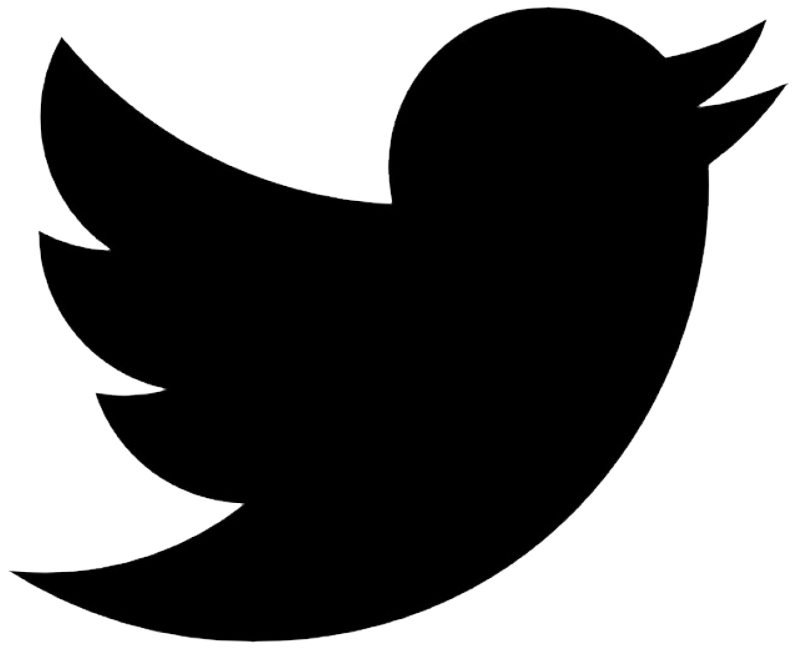

In [196]:
# Import Twitter Logo
image = np.array(Image.open('twitter.png'))
    
fig = plt.figure() # Instantiate the figure object
fig.set_figwidth(14) # set width
fig.set_figheight(18) # set height

plt.imshow(image, cmap=plt.cm.gray, interpolation='bilinear') # Display data as an image
plt.axis('off') # Remove axis
plt.show() # Display image

In [197]:
tweets_string = pos_tweets['text'].tolist()
tweets_string = " ".join(tweets_string)

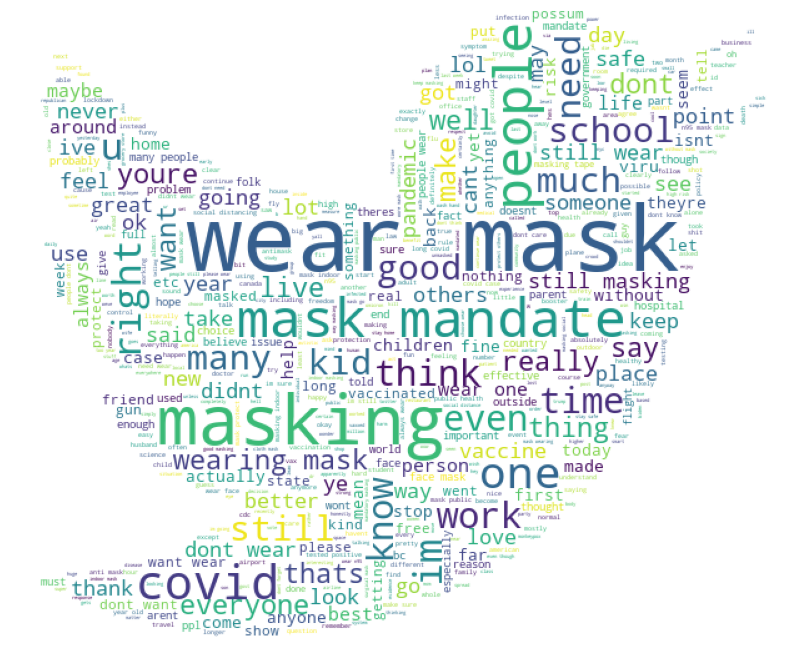

In [198]:
# Instantiate the Twitter word cloud object
twitter_wc = WordCloud(background_color='white', max_words=1500, mask=image)

# generate the word cloud
twitter_wc.generate(tweets_string)

# display the word cloud
fig = plt.figure()
fig.set_figwidth(14)  # set width
fig.set_figheight(18)  # set height

plt.imshow(twitter_wc)
plt.axis('off')
plt.show()

In [81]:
tweets_sentiment.to_csv('../tweeter/tweets_sentiment.csv')

In [124]:
import numpy as np

In [125]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix

In [126]:
vect = CountVectorizer(ngram_range=(1,2)).fit(clean_tweets['text'])

In [127]:
feature_names = vect.get_feature_names()

In [128]:
X = clean_tweets['text']
y = clean_tweets['Analysis']
X = vect.transform(X)

In [129]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 33)

In [130]:
x_train.shape

(47066, 529117)

In [131]:
x_test.shape

(11767, 529117)

In [132]:
logreg = LogisticRegression()
logreg.fit(x_train, y_train)
logreg_pred = logreg.predict(x_test)
logreg_acc = accuracy_score(logreg_pred, y_test)

/home/evgeniya/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [133]:
logreg_acc


0.8657261833942381

In [67]:
print(classification_report(y_test, logreg_pred))

              precision    recall  f1-score   support

    Negative       0.74      0.65      0.69       520
     Neutral       0.73      0.83      0.78       535
    Positive       0.79      0.78      0.79       745

    accuracy                           0.76      1800
   macro avg       0.75      0.75      0.75      1800
weighted avg       0.76      0.76      0.76      1800

